## Preproccessing and Setup

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
sns.set(style="white")
import warnings
warnings.filterwarnings('ignore')
import pickle
# import dcor 
# from statsmodels.tsa.seasonal import seasonal_decompose

import tensorflow as tf
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization

# from sklearn.preprocessing import MinMaxScaler, StandardScaler
# from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.utils import shuffle

In [2]:
tf.random.set_seed(13)
np.random.seed(13)
# random.seed(13)
def mean_absolute_percentage_error(y_true, y_pred):
  for i in range(len(y_true)):
    if y_true[i] == 0:
      print('MAPE * Founded')
      y_true[i] = np.mean(y_true)
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
data = pd.read_csv('DowDataset.csv', sep=',', date_parser=True)
dataset1 = data.iloc[:343].copy()
dataset2 = data.iloc[396:754].copy()
dataset_test = data.iloc[761:].copy()
full_dataset = pd.concat([dataset1, dataset2, dataset_test], axis=0 , ignore_index=True)
full_dataset = full_dataset.drop(['DATE', 'Flow_to_EQ'], axis=1)

In [7]:
class approach1:
  def __init__(self, df, goal, window_size = 5):
    self.df = df.copy()
    self.goal = goal
    self.window_size = window_size

    self.df['trend'] = self.df[self.goal].rolling(self.window_size).mean().fillna(method='bfill')
    self.df['residual'] = self.df[self.goal] - self.df['trend']
    self.df['target'] = self.df['residual'].shift(-1).fillna(method='ffill')
    self.df['goal'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [6, 24]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'linear'
      self.model_layers = 2
      self.model_neurons = [10, 18]
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'relu'
      self.model_layers = 2
      self.model_neurons = [14, 22]

  def preprocessing(self, cut_off):
    from sklearn.utils import shuffle
    print(self.df['goal'].head(10))
    self.trend_train, self.X, self.Y, self.goal_train = shuffle(self.df['trend'], self.X, self.df['target'], self.df['goal'], random_state = 13)
    print(self.goal_train.head(10))
    self.Xt = self.X.iloc[-cut_off:].reset_index(drop=True)
    self.X = self.X.iloc[:-cut_off]

    self.Yt = self.Y.iloc[-cut_off:].reset_index(drop=True)
    # self.Y = self.Y.iloc[:-cut_off]
    # self.y = self.Y.reset_index(drop=True)[:-cut_off]
    self.Y = self.Y.iloc[:-cut_off].reset_index(drop=True)
    
    self.trend_test = self.trend_train.iloc[-cut_off:].reset_index(drop=True)
    self.trend_train = self.trend_train.iloc[:-cut_off]

    self.goal_test = self.goal_train.iloc[-cut_off:].reset_index(drop=True)
    self.goal_train = self.goal_train.iloc[:-cut_off]
    print(self.goal_train)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.Yt
    #print(self.Y_test)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(self.model_neurons[0], activation = self.model_activation, input_dim= self.X_train.shape[1]))
    self.model.add(BatchNormalization())
    if self.model_layers == 2:
      self.model.add(Dense(self.model_neurons[1], activation = self.model_activation))
    self.model.add(Dense(1))

    self.model.compile(optimizer= self.model_optimizer, loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1, shuffle = False)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach1.h5')

  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    ACTIVATION = ['relu', 'tanh']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100
    for activation in ACTIVATION: 
      for optimizer in OPTIMIZER:
        for num_layer in NUM_LAYER:
          if num_layer == 1:
            for neurons in NUM_UNITS:
              self.model = tf.keras.Sequential()
              self.model.add(Dense(neurons, activation=activation, input_dim= self.X_train.shape[1]))
              self.model.add(Dense(1))
              self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
              history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history_Ann.history['val_loss']))
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history_Ann.history['val_loss']) < min_score:
                min_score = min(history_Ann.history['val_loss'])
                min_score_pos = n
              n+=1
          if num_layer == 2:
            for neurons in NUM_UNITS:
              for neurons2 in NUM_UNITS:
                self.model = tf.keras.Sequential()
                self.model.add(Dense(neurons, activation=activation, input_dim= self.X_train.shape[1]))
                self.model.add(Dense(neurons2, activation=activation))
                self.model.add(Dense(1))
                self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
                history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)   
                # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history_Ann.history['val_loss'])) 
                self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
                print(self.tune_results[f'{n}'])
                if min(history_Ann.history['val_loss']) < min_score:
                  min_score = min(history_Ann.history['val_loss'])
                  min_score_pos = n
                n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}']
  
  def testing(self):
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])    
    self.prediction = self.prediction*self.y_std + self.y_mean
    self.full_prediction = self.trend_test + self.prediction['Prediction']
    
    self.Y_test += self.trend_test

    print('*** ANN estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

  def training_results(self):
    self.train_prediction = pd.DataFrame(self.model.predict(self.X_train), columns=['Prediction'])    
    self.train_prediction = self.train_prediction*self.y_std + self.y_mean
    self.train_full_prediction = self.trend_train + self.train_prediction['Prediction']
    # print(self.Y_train)
    # print(self.trend_train)
    self.Y_train += self.trend_train
    # print(self.Y_train)

    print(self.goal_train)
    print(self.train_full_prediction)
    print('*** ANN estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.goal_train.values, self.train_full_prediction))
    print ('R2: ',r2_score(self.goal_train.values, self.train_full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.goal_train.values, self.train_full_prediction.values, squared=False))
    
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.goal_train.values, label = 'real ')
    plt.plot(self.train_full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Training samples (2020)')
    plt.legend()
    plt.show()


In [8]:
class approach2:
  def __init__(self, df, goal):
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [4, 32]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [2, 18]
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_activation = 'linear'
      self.model_layers = 2
      self.model_neurons = [4, 10]
    
  def preprocessing(self, cut_off):
    from sklearn.utils import shuffle
    self.x = self.X.copy()
    self.X, self.Y = shuffle(self.X, self.df['target'], random_state = 13)

    # self.Xt = self.X.iloc[-cut_off:].reset_index(drop=True)
    self.X = self.X.iloc[:-cut_off]

    # self.Yt = self.Y.iloc[-cut_off:].reset_index(drop=True)
    self.Y = self.Y.iloc[:-cut_off]
    
    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()

    self.X_train = (self.x - self.x_mean)/self.x_std
    self.Y_train = (self.df['target'] - self.y_mean)/self.y_std
    
    # self.X_test = (self.Xt - self.x_mean)/self.x_std
    # self.Y_test = self.Yt
    # print(self.Y_test)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def series_to_supervised(self, n_in=5, n_out=1, dropnan=True, shuffling = True):
    self.n_in = n_in
    self.n_out = n_out

    n_vars = 1 if type(self.X_train) is list else self.X_train.shape[1]
    df = pd.DataFrame(self.X_train)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
      cols.append(df.shift(i))
      names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
      cols.append(df.shift(-i))
      if i == 0:
        names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
      else:
        names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
      agg.dropna(inplace=True)
    self.supervised = agg
    self.supervised_train = self.supervised.values.reshape((self.supervised.shape[0], 1, self.supervised.shape[1]))
    self.Y_train = self.Y_train.iloc[n_in:]
    if shuffling == True:
      self.supervised_train, self.Y_train = shuffle(self.supervised_train, self.Y_train, random_state = 13)

  def training(self, max_epochs = 50):
    #print(neurons)
    self.model = tf.keras.Sequential()
    self.model.add(LSTM(self.model_neurons[0], activation = self.model_activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
    self.model.add(Dropout(0.1))
    if self.model_layers == 2:
      self.model.add(BatchNormalization())
      self.model.add(LSTM(self.model_neurons[1], activation = self.model_activation))
    self.model.add(Dense(1))
    self.model.compile(loss='mse', optimizer=self.model_optimizer, metrics=['mape'])  
    history = self.model.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1, shuffle = False)
    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach2.h5')
  
  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    ACTIVATION = ['relu', 'linear', 'tanh']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100
    for activation in ACTIVATION:
      for optimizer in OPTIMIZER:
        for num_layer in NUM_LAYER:
          if num_layer == 1:
            for neurons in NUM_UNITS:
              self.models = tf.keras.Sequential()
              self.models.add(LSTM(neurons, activation = activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
              self.models.add(Dropout(0.1))
              self.models.add(Dense(1))
              self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
              history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history.history['val_loss']))
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history.history['val_loss']) < min_score:
                min_score = min(history.history['val_loss'])
                min_score_pos = n
              n+=1
          if num_layer == 2:
            for neurons in NUM_UNITS:
              for neurons2 in NUM_UNITS:
                self.models = tf.keras.Sequential()
                self.models.add(LSTM(neurons, activation = activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
                self.models.add(Dropout(0.1))
                self.models.add(BatchNormalization())
                self.models.add(LSTM(neurons2, activation = activation, return_sequences=True))
                self.models.add(Dense(1))
                self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
                history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1) 
                # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history.history['val_loss'])) 
                self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
                print(self.tune_results[f'{n}'])
                if min(history.history['val_loss']) < min_score:
                  min_score = min(history.history['val_loss'])
                  min_score_pos = n
                n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}'] 

  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    def series_to_supervised_test(X_test, n_in=self.n_in, n_out=self.n_out, dropnan=True):
      n_vars = 1 if type(X_test) is list else X_test.shape[1]
      df = pd.DataFrame(X_test)
      cols, names = list(), list()
      # input sequence (t-n, ... t-1)
      for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
      # forecast sequence (t, t+1, ... t+n)
      for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
          names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
        else:
          names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
      # put it all together
      agg = pd.concat(cols, axis=1)
      agg.columns = names
      # drop rows with NaN values
      if dropnan:
        agg.dropna(inplace=True)
      supervised = agg
      supervised_test = supervised.values.reshape((supervised.shape[0], 1, supervised.shape[1]))
      return supervised_test
    # self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.Xt = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')

    # self.Xt = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill')
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill').iloc[self.n_in:]
    self.supervised_test = series_to_supervised_test(self.X_test)
    
    self.prediction = pd.DataFrame(self.model.predict(self.supervised_test).reshape(-1,1), columns=['Prediction'])
    self.full_prediction = self.prediction*self.y_std + self.y_mean
    
    print('*** LSTM estimation ***')
    # print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    # print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

  def series_to_supervised_eval(self, dropnan=True, shuffling = True):
    n_vars = 1 if type(self.X_train) is list else self.X_train.shape[1]
    df = pd.DataFrame(self.X_train)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(self.n_in, 0, -1):
      cols.append(df.shift(i))
      names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, self.n_out):
      cols.append(df.shift(-i))
      if i == 0:
        names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
      else:
        names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:      
      agg.dropna(inplace=True)
    self.train_supervised = agg
    self.supervised_train_eval = self.train_supervised.values.reshape((self.train_supervised.shape[0], 1, self.train_supervised.shape[1]))
    if shuffling == True:
      print(self.supervised_train_eval.shape, self.Y_train.shape)
      self.supervised_train_eval, self.Y_train = shuffle(self.supervised_train_eval, self.Y_train, random_state = 13)

  def training_results(self):    
    self.prediction = pd.DataFrame(self.model.predict(self.supervised_train_eval).reshape(-1,1), columns=['Prediction'])
    self.full_prediction = self.prediction*self.y_std + self.y_mean
    self.Y_eval = self.Y_train*self.y_std + self.y_mean
    
    print('*** LSTM estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_eval.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_eval.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_eval.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_eval.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [9]:
class approach3:
  def __init__(self, df, goal):    
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill')
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    
    self.Y = self.df['target'].fillna(method='bfill')
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = self.X
    self.Y_train = self.Y
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
    # self.model.save('approach3.h5')
    pickle.dump(self.model, open('approach3.sav', 'wb'))
  
  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    if self.goal == 'D_COD_ON':
      self.X_test = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')

    # self.X_test = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill').fillna(method='bfill')
    self.X_test = (self.X_test - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill')
        
    self.prediction = self.model.predict(self.X_test)
    # self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])
    full_prediction = self.prediction*self.y_std + self.y_mean
    self.full_prediction = full_prediction 
    
    print('*** Delta estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

# BT_C_MVLSS

In [10]:
active_target = "BT_C_MVLSS"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null    f

In [11]:
# cut_off = 68
# active_targets = ['BT_C_MVLSS', 'EQ_COD', 'D_COD_ON']
# for j in range(0,3):
#   active_target = active_targets[j]
#   print('\n********************************************************************************************\n')
#   print(f'\n************************ {active_target} *****************************\n')
#   print('\n********************************************************************************************\n')
#   for i in range(2,8):
#     print('\n********************************************************************************************')
#     print(f'Trial with {i} day rolling windowning')
#     app1 = approach1(dataset.iloc[:-cut_off], active_target, i)
#     app1.training()
#     app1.testing(dataset.iloc[5:-cut_off])
#     app1.full_prediction.shape

## Approach 1

0    8000.0
1    7600.0
2    9500.0
3    8900.0
4    8900.0
5    8800.0
6    8400.0
7    8300.0
8    8600.0
9    8100.0
Name: goal, dtype: float64
227    7200.0
101    8900.0
67     7100.0
33     8400.0
249    6800.0
118    8400.0
12     8400.0
136    8900.0
219    9500.0
127    9100.0
Name: goal, dtype: float64
227    7200.0
101    8900.0
67     7100.0
33     8400.0
249    6800.0
        ...  
3      8900.0
189    8600.0
91     7800.0
260    7100.0
299    4500.0
Name: goal, Length: 275, dtype: float64


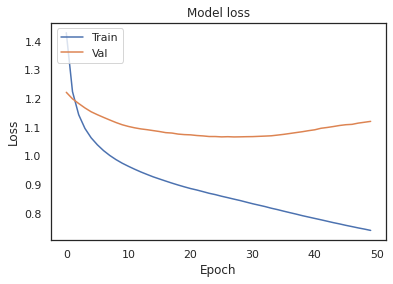

227    7200.0
101    8900.0
67     7100.0
33     8400.0
249    6800.0
        ...  
3      8900.0
189    8600.0
91     7800.0
260    7100.0
299    4500.0
Name: goal, Length: 275, dtype: float64
0      8303.160370
1              NaN
2      8406.640041
3      8320.739582
4      8312.859306
          ...     
335            NaN
336            NaN
339            NaN
341            NaN
342            NaN
Length: 326, dtype: float64
*** ANN estimation ***


ValueError: ignored

In [12]:
cut_off = 68
app1 = approach1(dataset, active_target, 5)
app1.preprocessing(68)
app1.training()
app1.training_results()# app1.testing()
app1.train_full_prediction.shape

*** ANN estimation ***
MAPE:  6.21240038521588
R2:  0.3839564429029483
RMSE:  29.36907449050673


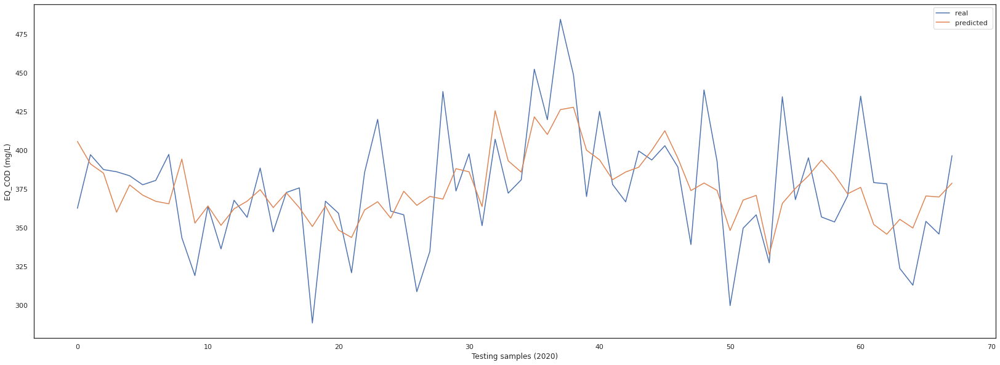

In [ ]:
app1.testing()

## Approach 2

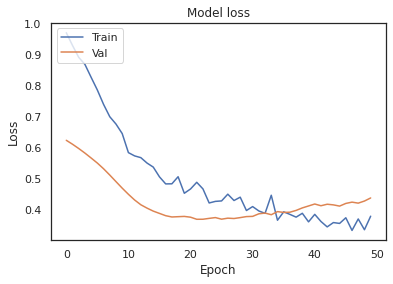

(336, 1, 72) (336,)
*** LSTM estimation ***
MAPE:  16.340280801194723
R2:  -0.3859319133406336
RMSE:  64.76521169722123


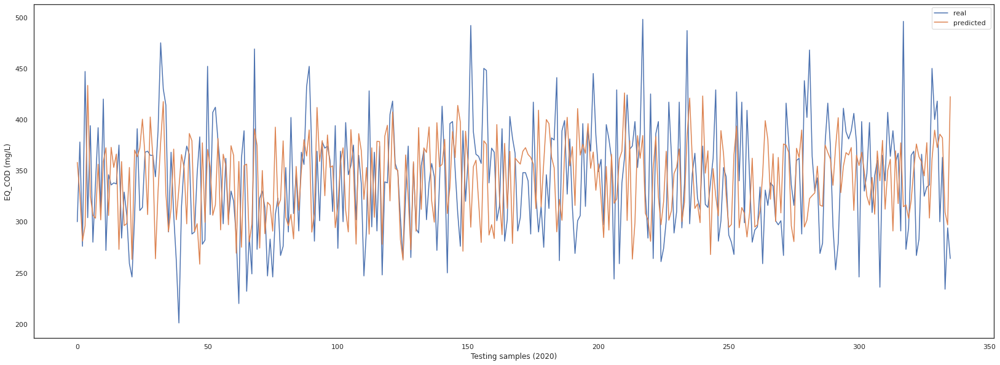

(336, 1)

In [ ]:
app2 = approach2(dataset, active_target)
app2.preprocessing(68)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training()
# app2.testing(dataset[-137:])
app2.series_to_supervised_eval()
app2.training_results()
app2.full_prediction.shape

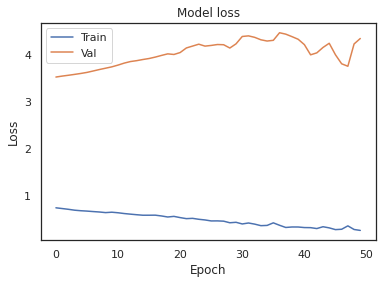

*** LSTM estimation ***
MAPE:  9.607799078307774
R2:  0.28034773813401215
RMSE:  722.7604967682307


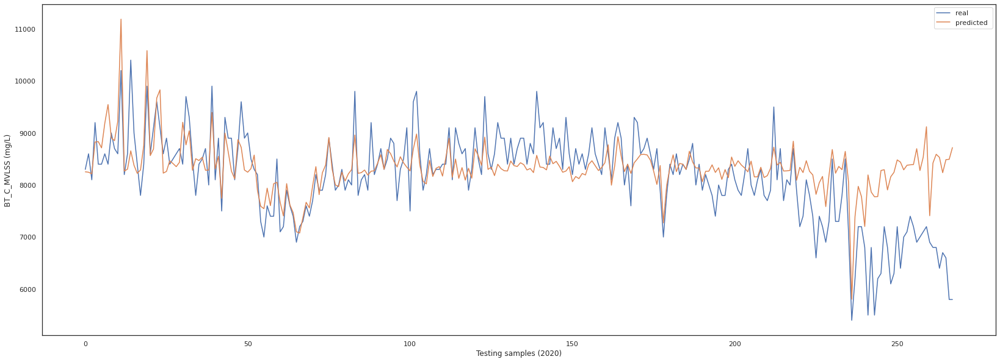

(268, 1)

In [ ]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

In [ ]:
from sklearn.utils import shuffle
supervised_shuffled = shuffle(app2.supervised_train, random_state = 13)
app2.supervised_train.shape, supervised_shuffled.shape

((268, 1, 72), (268, 1, 72))

## Approach 3

*** Delta estimation ***
MAPE:  18.290246157201555
R2:  -0.05169726193631474
RMSE:  1503.951891222381


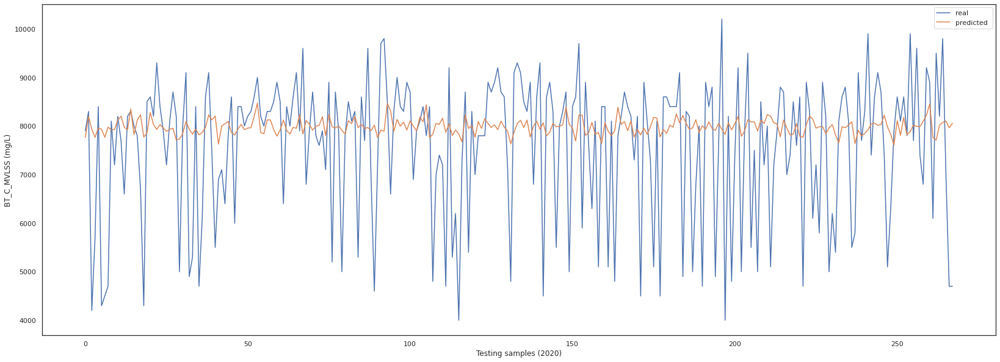

(268,)

In [ ]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

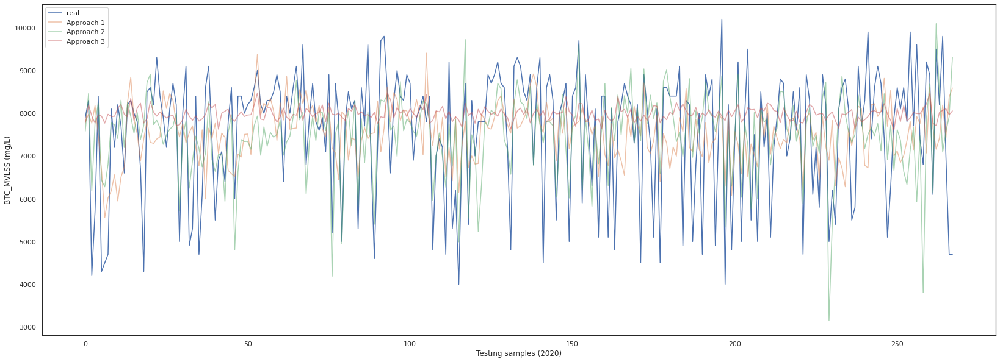

In [ ]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [ ]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      23141.816130
1      24630.011733
2      21882.926861
3      23717.620297
4      23678.095419
           ...     
263    23890.927158
264    23351.246641
265    23096.034124
266    24265.329184
267    25956.615039
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  17.42377766964196
R2:  0.08417045155634983
RMSE:  1403.446618029338


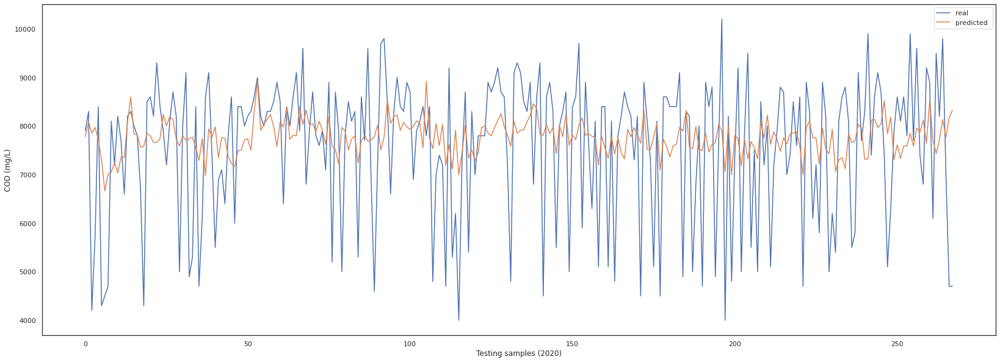

In [ ]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  15.327614973501586
R2:  0.27012447943455475
RMSE:  1252.8900826002532


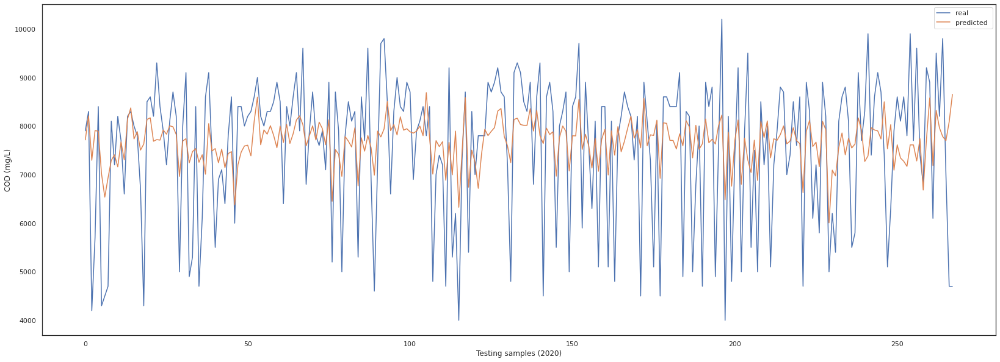

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

In [ ]:
class Ensemble:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[['model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[['model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
8/8 [==============================] - 1s 24ms/step - loss: 1.1288 - MAPE: 159.6804 - val_loss: 1.1084 - val_MAPE: 162.3620
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0636 - MAPE: 155.8447 - val_loss: 1.1110 - val_MAPE: 159.3247
Epoch 3/50
8/8 [==============================] - 0s 6ms/step - loss: 1.0029 - MAPE: 151.1651 - val_loss: 1.1124 - val_MAPE: 156.5479
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9567 - MAPE: 147.6631 - val_loss: 1.1147 - val_MAPE: 153.6958
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9083 - MAPE: 144.3839 - val_loss: 1.1198 - val_MAPE: 151.9645
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 0.8702 - MAPE: 141.4611 - val_loss: 1.1271 - val_MAPE: 150.4806
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 0.8333 - MAPE: 138.8690 - val_loss: 1.1336 - val_MAPE: 148.9124
Epoch 8/50
8/8 [==============================] - 0s 6ms/step

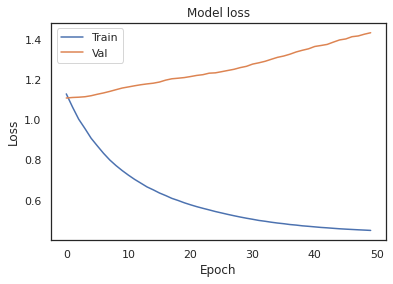

In [ ]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[18.66358  20.58086  21.60227  18.36922  20.037518 26.56312  35.31612
 24.620003 18.65338  18.575577 19.330458 21.427961 20.544043 19.465424
 18.693266 18.548645 18.902233 18.761135 18.542349 21.89828  26.00601
 18.399387 18.42657  18.374891 18.3885   18.4093   18.61694  18.608267
 18.363016 29.440147 18.619133 18.447195 22.70322  20.529976 18.947445
 22.315088 21.30363  22.660997 20.029865 19.706776 19.752598 22.559137
 19.434587 23.342463 18.58716  18.359503 46.589222 23.774794 19.021534
 18.977163 18.84427  20.510677 18.420624 19.294668 18.913246 18.593012
 18.397345 18.393372 18.381964 18.859581 18.723682 18.834738 18.511885
 18.705603 18.575148 22.92953  18.50358  19.023788 18.6463   18.372236
 18.808533 18.428833 18.958122 19.017092 18.632515 18.682821 37.18336
 18.78467  18.380161 25.338972 18.427546 19.428976 19.136564 20.432785
 31.503647 18.655165 19.832651 19.34968  19.366703 25.206589 18.360762
 20.647278 19.750114 20.8767

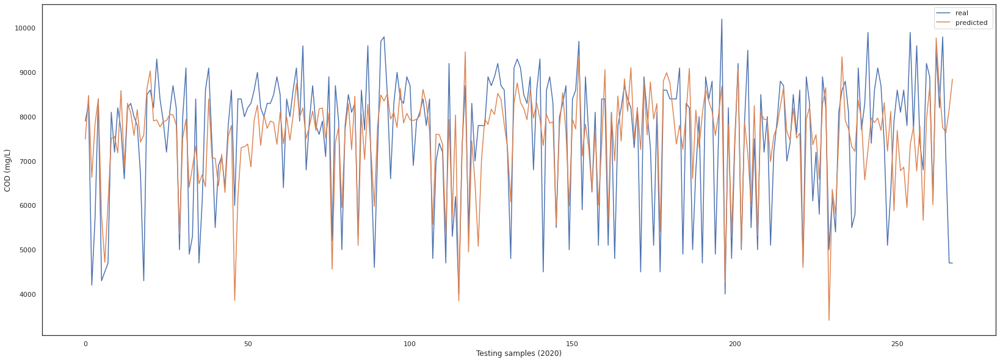

In [ ]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


In [ ]:
class Ensemble2:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[[self.goal, 'model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
8/8 [==============================] - 1s 25ms/step - loss: 1.1960 - MAPE: 216.6121 - val_loss: 1.9104 - val_MAPE: 277.8011
Epoch 2/50
8/8 [==============================] - 0s 7ms/step - loss: 1.1368 - MAPE: 208.7088 - val_loss: 1.8658 - val_MAPE: 270.4174
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0813 - MAPE: 202.3438 - val_loss: 1.8130 - val_MAPE: 261.5361
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0323 - MAPE: 195.3833 - val_loss: 1.7695 - val_MAPE: 253.6124
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 0.9854 - MAPE: 189.1658 - val_loss: 1.7371 - val_MAPE: 246.6658
Epoch 6/50
8/8 [==============================] - 0s 6ms/step - loss: 0.9463 - MAPE: 183.8531 - val_loss: 1.7093 - val_MAPE: 239.7324
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 0.9069 - MAPE: 179.5149 - val_loss: 1.6762 - val_MAPE: 232.1113
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

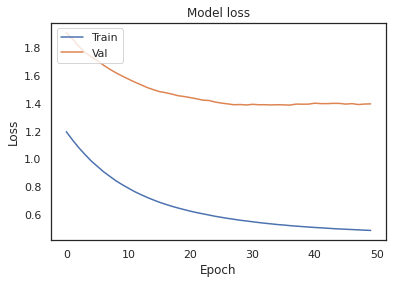

In [ ]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[18.72821  19.571457 22.767393 18.74439  18.542576 25.489775 28.980944
 21.551912 18.514816 18.876612 19.730106 18.548542 19.888956 18.557714
 20.832281 18.552864 18.750473 18.99952  19.034178 18.370932 21.68985
 18.397215 18.615185 18.419352 18.382019 18.368387 18.523914 18.469784
 18.75854  30.892614 18.553612 18.382828 24.83439  19.458132 18.555391
 21.77983  19.801872 21.417118 18.818579 21.14559  18.899628 23.238592
 18.48556  22.248747 18.433723 18.532156 50.13141  20.580091 19.041142
 18.384209 18.407171 19.731644 19.668484 22.164804 18.729599 18.463085
 18.388733 19.26702  18.375618 18.905977 18.372551 19.118479 18.564081
 18.527369 18.70076  19.1483   19.440449 18.413559 21.95328  18.80516
 18.388172 18.379177 18.722912 18.631912 18.68251  19.31282  46.07403
 18.508139 18.803286 28.626114 18.520576 18.529207 19.147896 19.156933
 30.989922 18.659779 19.783834 18.823112 18.747137 24.707388 18.758898
 18.610939 18.72606  19.9663

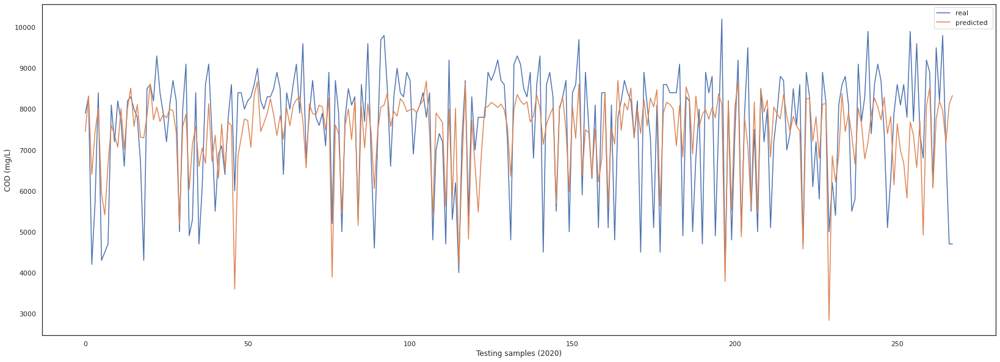

In [ ]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

In [ ]:
class Ensemble3:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
  

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
 
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 16, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons/2, activation='relu', input_dim = self.X_train.shape[1]))
    self.model.add(Dense(neurons, activation='relu'))
    self.model.add(Dense(3, activation='softmax'))

    print(self.Y_train.shape)
    print(self.X_train.shape)

    self.model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df_test['model1'] - self.df_test['target'])
    model2 = abs(self.df_test['model2'] - self.df_test['target'])
    model3 = abs(self.df_test['model3'] - self.df_test['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Yt = pd.get_dummies(temp)   

    self.Y_test = self.Yt
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    print(self.X_test, self.Y_train)

    self.score = self.model.evaluate(self.X_test, self.Y_test)
    self.prediction = self.model.predict(self.X_test)
    
    self.full_prediction = np.zeros(len(self.prediction))
    self.selection = pd.DataFrame(self.prediction).idxmax(axis=1)

    
    for i in range(len(self.prediction)):
      self.full_prediction[i] = self.df_test[f'model{int(self.selection[i])+1}'][i]
    # print(self.full_prediction)

    self.Ys_test = self.df_test['target']
    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('MAPEsci: ',mean_absolute_error(self.Ys_test, self.full_prediction)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('R2: ',r2_score(self.Ys_test, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Ys_test, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Ys_test, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

     0  1  2
0    1  0  0
1    0  0  1
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 32ms/step - loss: 1.0887 - accuracy: 0.4274 - val_loss: 1.1460 - val_accuracy: 0.2963
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0797 - accuracy: 0.4357 - val_loss: 1.1468 - val_accuracy: 0.2963
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0716 - accuracy: 0.4398 - val_loss: 1.1470 - val_accuracy: 0.2963
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0648 - accuracy: 0.4357 - val_loss: 1.1499 - val_accuracy: 0.2963
Epoch 5/50
8/8 [==============================] - 0s 6ms/step - loss: 1.0581 - accuracy: 0.4315 - val_loss: 1.1519 - val_accuracy: 0.2593
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0514 - accuracy: 0.4398 - val_loss: 1.1

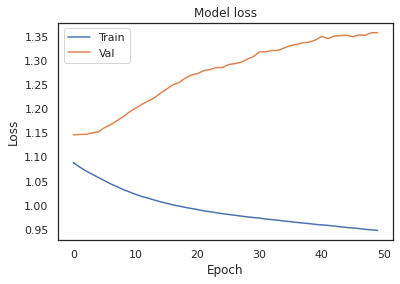

In [ ]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

     BT_C_MVLSS    model1    model2    model3
0      0.901078  0.384231  0.093814 -1.381028
1      0.216586  0.668514  1.030508  1.346606
2      0.490383  0.342121 -1.398439 -0.314509
3     -2.316036  0.983381  0.298874 -1.387260
4     -1.289297 -0.101825  0.790760 -0.138209
..          ...       ...       ...       ...
263    1.311773 -0.200185  1.025689  0.217152
264    0.421933  1.002807 -0.427335  0.539406
265    1.517121 -0.182636  0.075068  0.759963
266   -0.399457  1.298235  0.456577 -0.125478
267   -1.973790  1.627015  1.939447  0.448887

[268 rows x 4 columns]      0  1  2
0    1  0  0
1    0  0  1
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 0.9884 - accuracy: 0.4925
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(13.624719163977394, shape=(), dtype=float64)
MAPEsci:  89510.93367738288
MAPE:  13.624719163977407
R2:  0.35

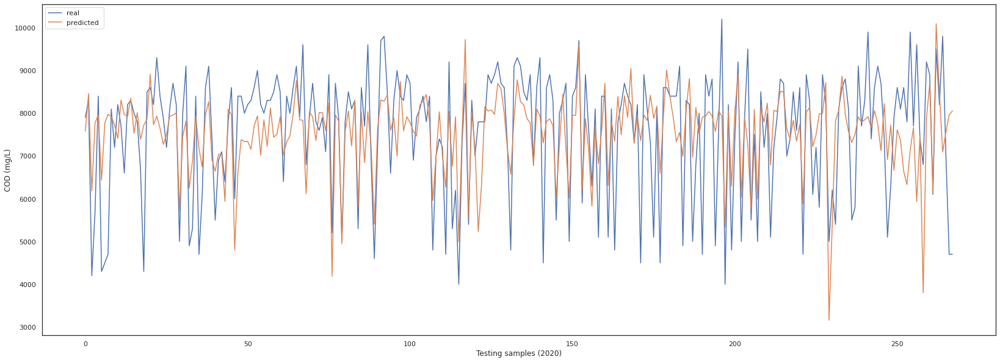

In [ ]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(1)

192

## Testing


*** ANN estimation ***
MAPE:  22.630298941003428
R2:  -0.12424780521287215
RMSE:  1716.3868761723268


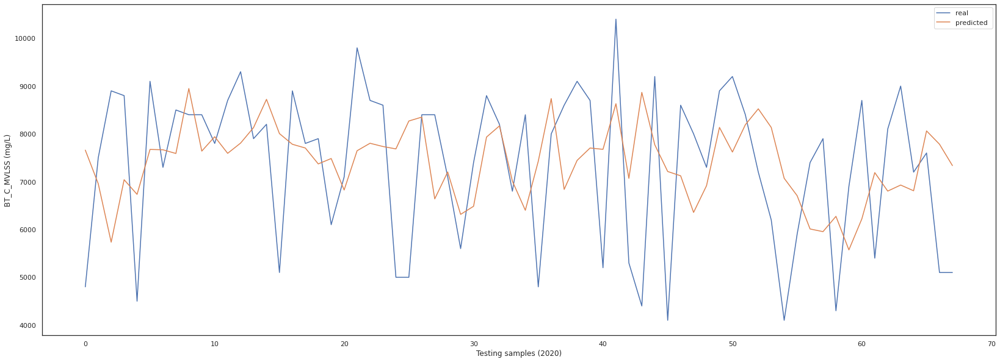

(68,)

In [ ]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  24.498430133446796
R2:  -0.274619939756916
RMSE:  1827.5720816050693


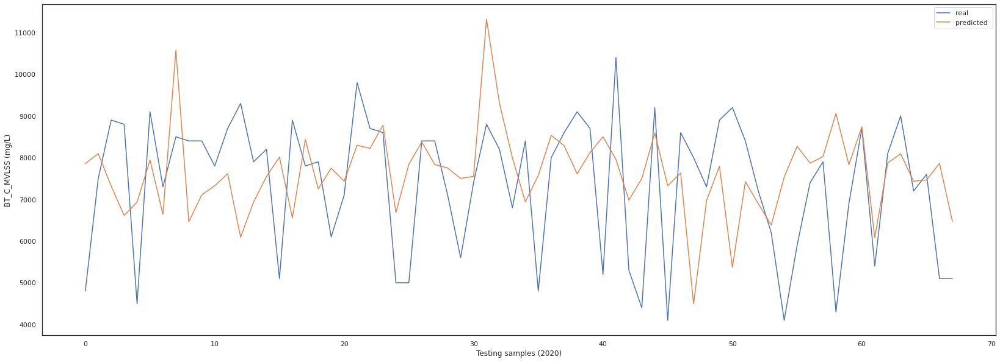

(68, 1)

In [ ]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  22.34983995998377
R2:  -0.12098244298298333
RMSE:  1713.8924526070437


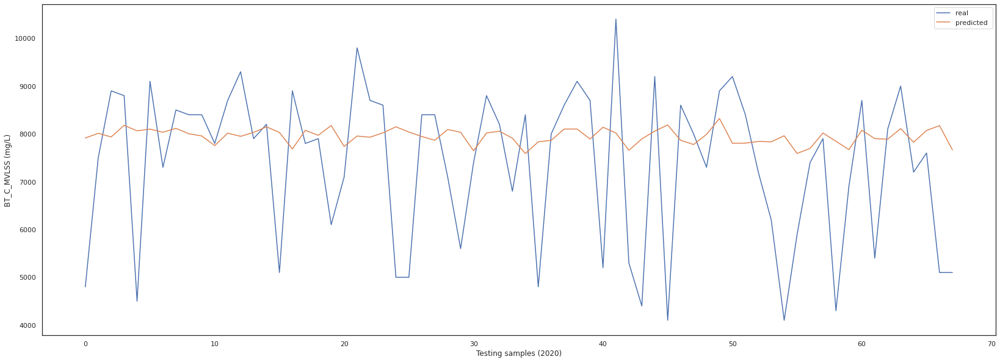

(68,)

In [ ]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  21.29172129135041
R2:  -0.027538266367496123


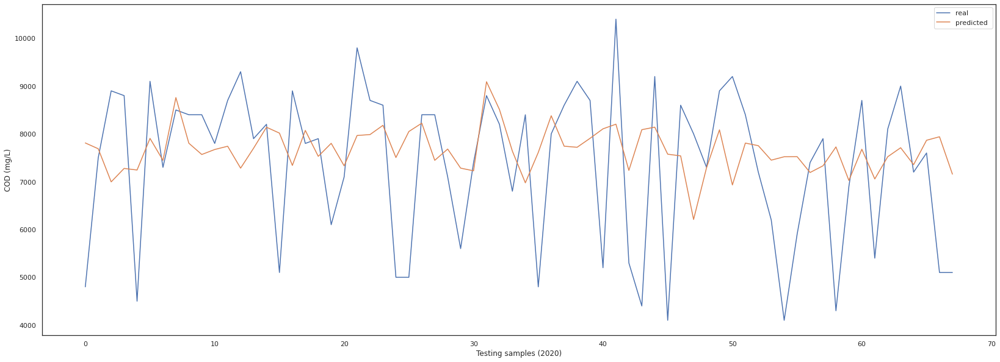

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[22.662924 24.558914 22.86927  22.353886 22.848738 23.19665  21.812061
 49.144802 22.591944 21.607368 21.579372 22.055248 23.009624 21.925596
 22.8933   23.16468  24.006681 24.922142 21.723646 22.293406 22.508495
 24.419367 23.886002 27.328228 21.86431  23.10964  24.6349   21.828693
 22.341192 21.580374 23.259455 55.88952  29.476856 22.972198 26.271748
 21.735119 25.872248 26.484629 21.990898 23.752476 25.407505 23.838749
 23.83871  23.101461 25.660652 21.602324 21.58905  51.300323 23.132177
 23.304989 27.553165 21.98196  21.985964 22.16212  21.636703 21.641947
 21.80647  22.668594 34.224384 22.315323 33.579567 26.134453 22.09485
 24.414526 22.218525 22.169128 23.031258 25.884577], shape=(68,), dtype=float32)
MAPEsci:  140036.33674172795
MAPE:  24.892736090652498
R2:  -0.3016960568461744
RMSE:  1846.8811792144174


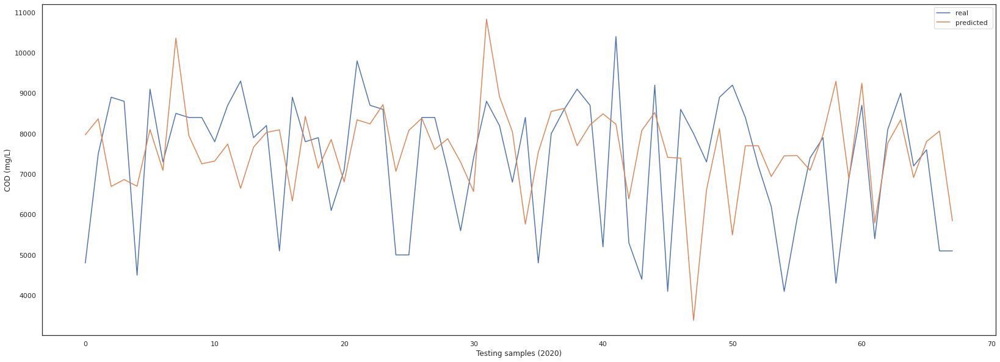

In [ ]:
ensemble_model.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[22.44477  22.830221 23.310133 23.8859   22.822113 24.066868 22.944359
 27.190748 22.319197 21.653334 21.626223 22.841389 24.322052 21.715641
 24.526777 23.161835 22.85815  24.195932 21.60553  22.145348 22.080956
 23.079397 23.196741 24.254526 22.247805 24.735918 23.769783 21.589508
 21.97139  21.599077 23.034534 26.404072 24.194038 22.3441   25.629177
 21.796665 23.149843 23.490229 21.736536 22.981253 24.593235 25.0168
 24.77516  23.102894 24.148571 22.069107 21.63835  55.825825 22.36696
 23.140543 30.922962 21.68365  21.810059 21.578844 21.897339 23.13388
 21.62618  21.75252  22.704006 21.755684 26.360893 26.960894 21.89653
 22.708584 21.858706 23.560179 22.733505 24.406916], shape=(68,), dtype=float32)
MAPE:  23.70265963965092
R2:  -0.2314234038448435
RMSE:  1796.3371955691778


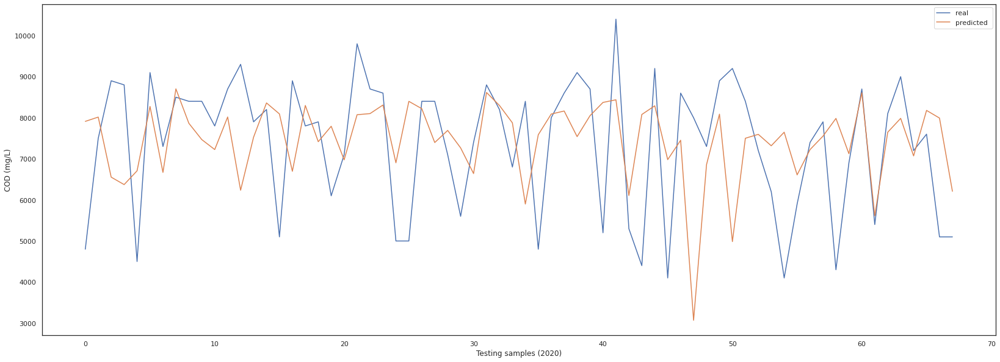

In [ ]:
ensemble_model2.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

    BT_C_MVLSS    model1    model2    model3
0    -2.384485  0.177836  0.388608 -0.456964
1    -1.905341 -0.916823  0.642782  0.177447
2    -0.057211 -2.822825 -0.187236 -0.309942
3     0.901078 -0.787705 -0.939056  1.236376
4     0.832629 -1.264755 -0.596699  0.506084
..         ...       ...       ...       ...
63    0.353484 -0.961135  0.637067  0.802094
64    0.969527 -1.147655 -0.063073 -1.022767
65   -0.262559  0.803479 -0.030175  0.554011
66    0.011238  0.370067  0.394170  1.199060
67   -1.699993 -0.326726 -1.092008 -2.032064

[68 rows x 4 columns]      0  1  2
0    1  0  0
1    0  0  1
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
3/3 [==============================] - 0s 4ms/step - loss: 1.2928 - accuracy: 0.3824
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(23.086122799963903, shape=(), dtype=float64)
MAPEsci:  143065.31008494165
MAPE:  23.086122799963913
R2:  -0.2977745152683

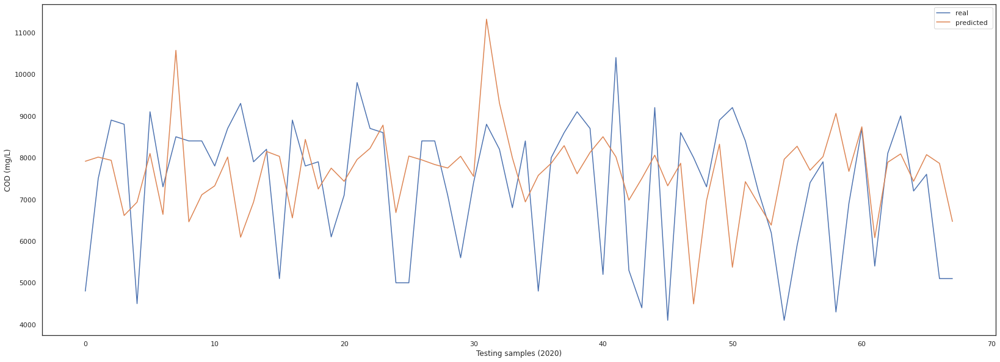

In [ ]:
ensemble_model3.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(3)

0

# EQ_COD

In [ ]:
active_target = "EQ_COD"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 343 entries, 227 to 338
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null   

## Approach 1

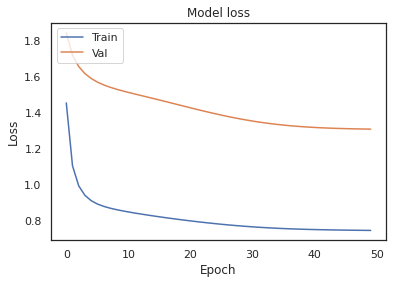

*** ANN estimation ***
MAPE:  14.444207411168254
R2:  0.004879313064176993
RMSE:  56.559250614983775


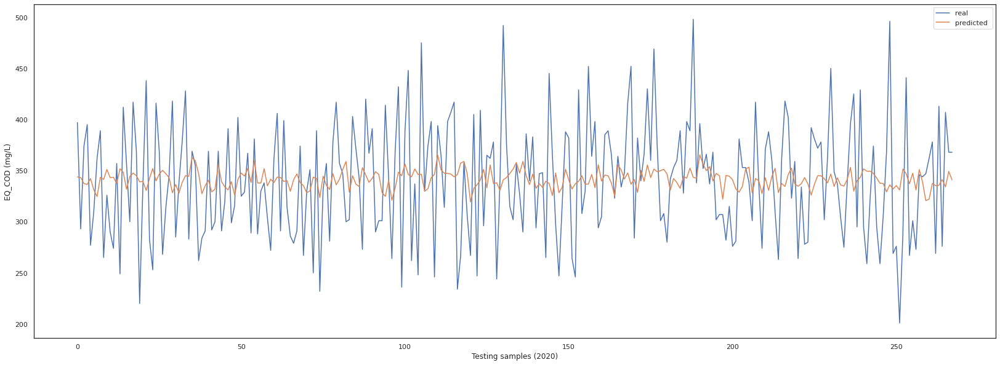

(268,)

In [ ]:
cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[2:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

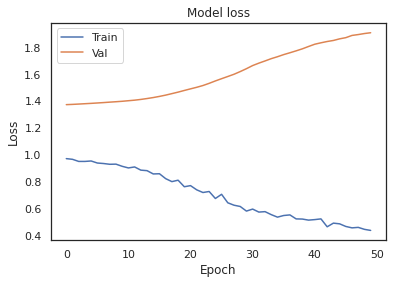

*** LSTM estimation ***
MAPE:  16.357777866460555
R2:  0.3990388296853422
RMSE:  43.953045769252086


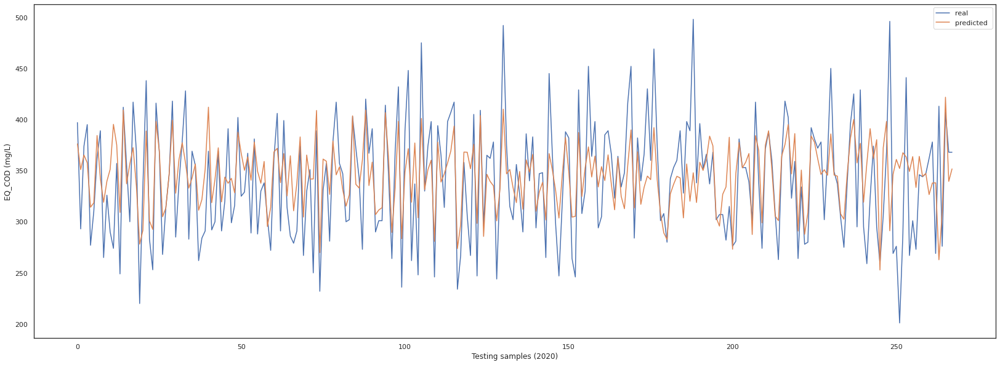

(268, 1)

In [ ]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE:  14.296422165232164
R2:  0.019264203506916933
RMSE:  56.14896857207185


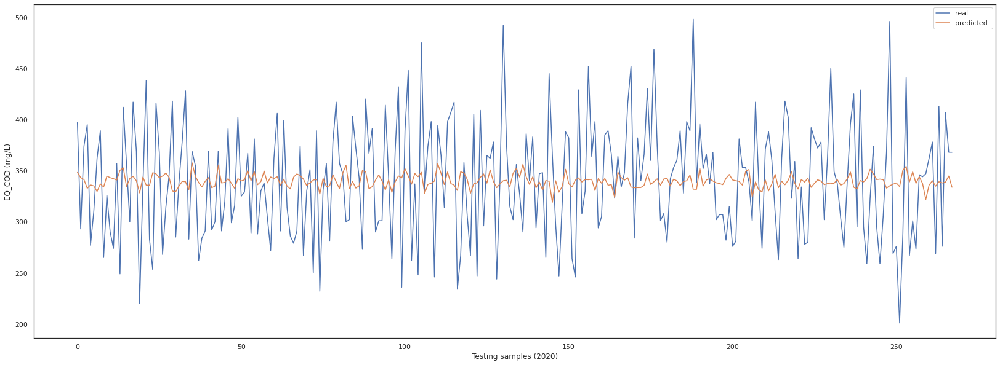

(268,)

In [ ]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

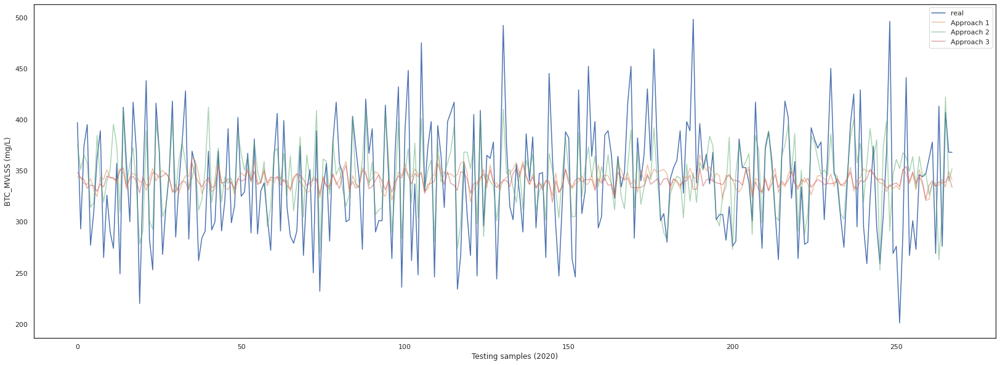

In [ ]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [ ]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      1068.250414
1      1037.430044
2      1043.841847
3      1026.935031
4       992.441306
          ...     
263     937.598840
264     988.497583
265    1094.739519
266    1033.491837
267    1026.370203
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  14.339507865510562
R2:  0.014757818939215572
RMSE:  56.277820221807154


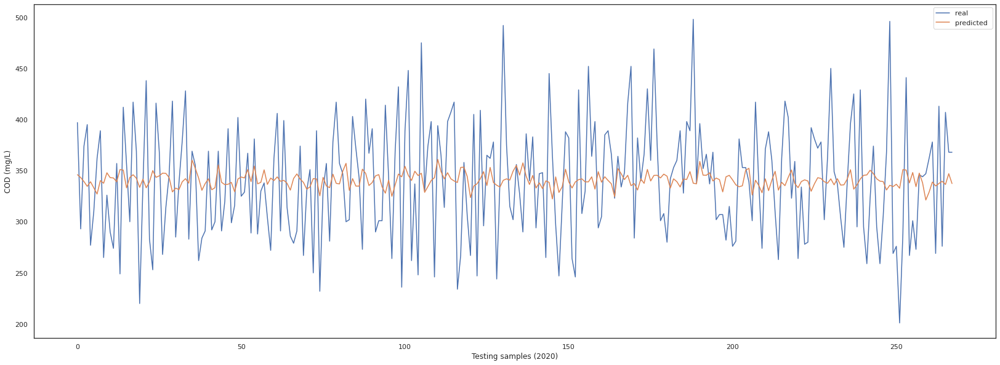

In [ ]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  12.727620737423246
R2:  0.2145404454528923
RMSE:  50.24903001979574


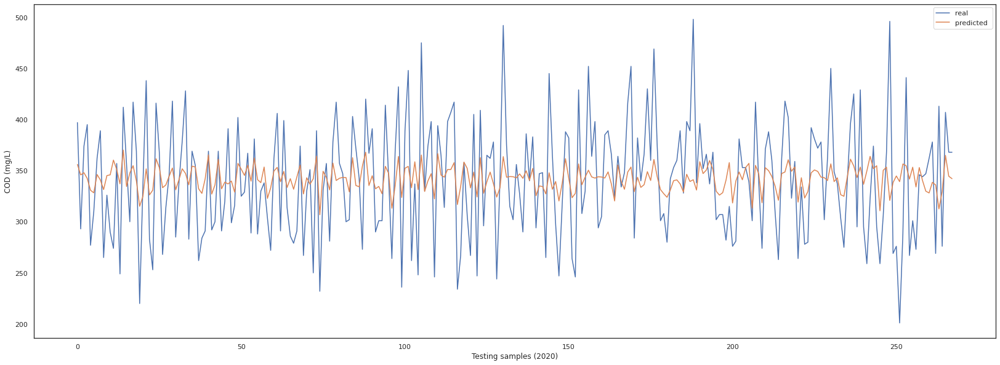

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

Epoch 1/50
8/8 [==============================] - 1s 26ms/step - loss: 1.1470 - MAPE: 173.3361 - val_loss: 1.3924 - val_MAPE: 116.3406
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0982 - MAPE: 166.2736 - val_loss: 1.3973 - val_MAPE: 113.0211
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0502 - MAPE: 161.3540 - val_loss: 1.4012 - val_MAPE: 109.3725
Epoch 4/50
8/8 [==============================] - 0s 6ms/step - loss: 1.0073 - MAPE: 155.9468 - val_loss: 1.4059 - val_MAPE: 106.6553
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9689 - MAPE: 153.4209 - val_loss: 1.4120 - val_MAPE: 105.1440
Epoch 6/50
8/8 [==============================] - 0s 6ms/step - loss: 0.9317 - MAPE: 150.1141 - val_loss: 1.4188 - val_MAPE: 104.6441
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 0.8959 - MAPE: 146.3098 - val_loss: 1.4281 - val_MAPE: 104.9516
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

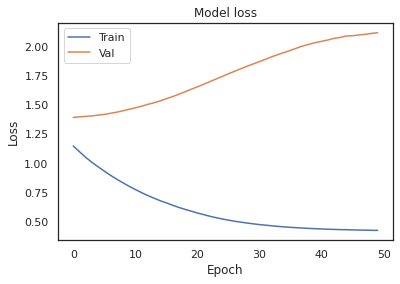

In [ ]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[15.493387  14.622249  16.871912  16.10489   15.663733  15.965137
 19.663862  14.763153  15.333501  14.549525  14.657831  24.97281
 20.006907  14.804651  20.453712  14.320165  15.807469  18.070154
 14.345558  27.487373  17.01729   23.937958  17.153103  15.692931
 20.937187  17.97148   15.010723  14.813127  14.381717  25.967682
 14.653354  15.7311735 22.108212  17.254267  14.336011  14.35917
 15.172503  14.781477  15.596226  14.801275  29.189825  15.840562
 14.353992  15.500702  15.147684  14.34732   14.588112  14.5224495
 14.74659   23.050108  18.224447  15.524117  15.23812   14.313703
 17.14957   15.369412  14.33994   14.985172  18.573462  14.991705
 17.227684  17.814363  14.41137   17.658533  14.680653  16.237154
 15.19404   14.3152895 18.053896  16.231056  16.410063  14.318016
 14.463531  29.253275  32.42767   16.90583   16.425089  14.839978
 18.738314  14.445255  15.628025  14.314728  14.719382  14.760288
 27.946314  14.319613  14

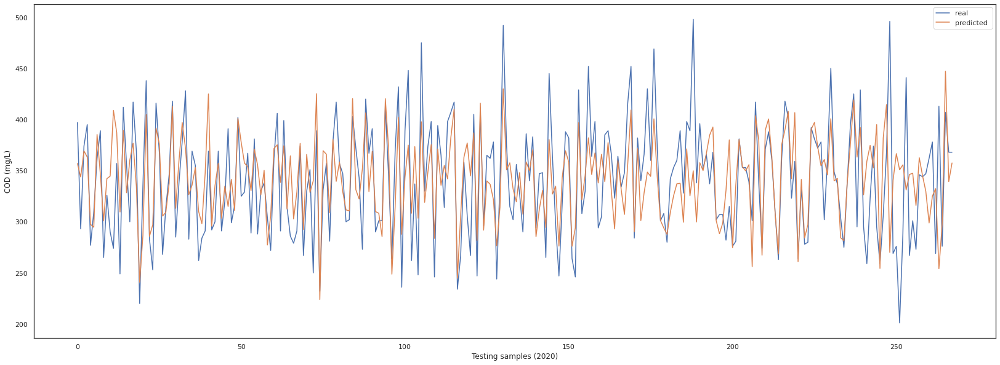

In [ ]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


Epoch 1/50
8/8 [==============================] - 1s 25ms/step - loss: 1.8587 - MAPE: 393.3337 - val_loss: 2.2030 - val_MAPE: 235.0072
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 1.7228 - MAPE: 368.7417 - val_loss: 2.1067 - val_MAPE: 223.0990
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 1.5954 - MAPE: 344.0545 - val_loss: 2.0260 - val_MAPE: 212.4036
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 1.4839 - MAPE: 327.1709 - val_loss: 1.9594 - val_MAPE: 202.3803
Epoch 5/50
8/8 [==============================] - 0s 6ms/step - loss: 1.3850 - MAPE: 308.7376 - val_loss: 1.9015 - val_MAPE: 192.7707
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 1.2989 - MAPE: 291.1275 - val_loss: 1.8516 - val_MAPE: 185.1669
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 1.2167 - MAPE: 273.7661 - val_loss: 1.8143 - val_MAPE: 178.1992
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

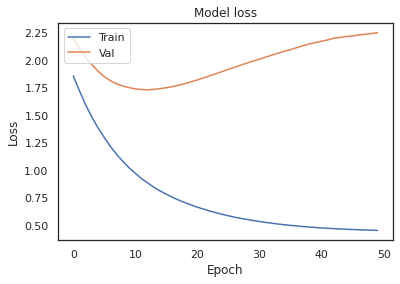

In [ ]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[22.260376  16.747036  18.801058  16.321009  15.054255  15.025327
 19.997953  14.8640585 14.736642  14.59784   16.586695  19.974451
 19.836872  14.716296  26.650705  14.316215  16.686543  17.231874
 14.376206  27.300123  16.954058  23.71603   18.29397   16.899454
 25.421377  17.435534  15.541937  14.4570055 16.10078   23.504068
 14.524491  16.383621  20.913185  15.924987  14.312318  14.895664
 14.339813  15.362676  14.949006  16.119837  24.950794  15.541051
 14.42204   18.814093  14.700444  15.081642  15.389861  15.197453
 14.727778  20.939844  16.031393  15.410757  17.292847  15.475863
 15.530168  15.911977  14.45998   16.894575  19.926067  14.539492
 18.527866  19.25932   14.557549  18.293179  14.455236  16.569712
 14.686542  15.236883  23.565306  17.591728  17.127007  14.908415
 15.169742  21.43773   36.278446  15.619161  16.509918  14.577894
 18.910685  16.205288  15.325816  14.6542845 14.313025  14.661513
 19.048061  14.33625   1

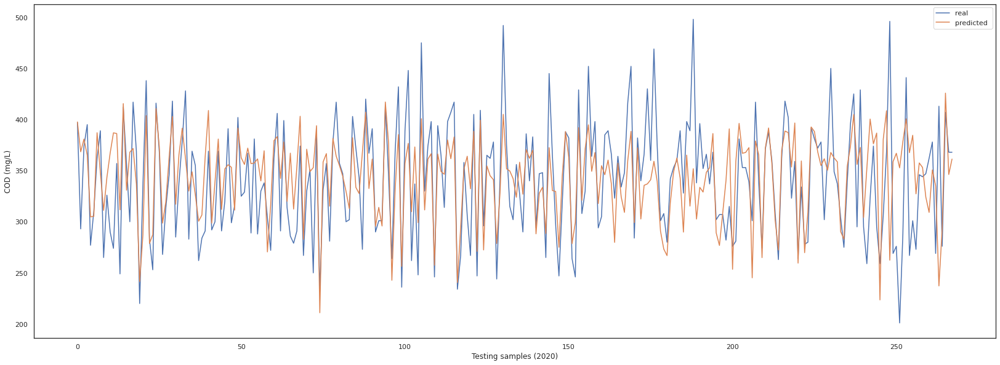

In [ ]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

     0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  0  0  1
264  0  1  0
265  0  1  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 29ms/step - loss: 0.9874 - accuracy: 0.5477 - val_loss: 1.1706 - val_accuracy: 0.3704
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.9565 - accuracy: 0.6100 - val_loss: 1.1919 - val_accuracy: 0.3333
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9347 - accuracy: 0.6307 - val_loss: 1.2172 - val_accuracy: 0.3333
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9146 - accuracy: 0.6556 - val_loss: 1.2413 - val_accuracy: 0.3333
Epoch 5/50
8/8 [==============================] - 0s 6ms/step - loss: 0.9027 - accuracy: 0.6556 - val_loss: 1.2690 - val_accuracy: 0.3333
Epoch 6/50
8/8 [==============================] - 0s 6ms/step - loss: 0.8913 - accuracy: 0.6556 - val_loss: 1.2

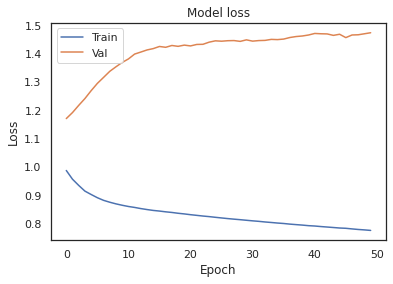

In [ ]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

       EQ_COD    model1    model2    model3
0   -0.444347  0.285118  0.973995  1.344467
1    0.999321  0.218187  0.188859  0.543944
2   -0.831673 -0.462441  0.632914  0.241426
3    0.594390 -0.557545  0.397397 -1.105107
4    0.964110  0.099532 -0.958740 -0.588147
..        ...       ...       ...       ...
263 -1.254210 -0.653885 -2.562663 -0.097752
264  1.281012 -0.007822 -1.111712 -0.289693
265 -1.130970 -0.831654  2.397901 -0.149141
266  1.175378  0.909557 -0.169877  0.790527
267  0.488756 -0.046136  0.210584 -0.949458

[268 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  0  0  1
264  0  1  0
265  0  1  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 0.8449 - accuracy: 0.6231
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(10.356566295086026, shape=(), dtype=float64)
MAPEsci:  3355.7727529041804
MAPE:  10.356566295086035
R2:  0.3990388296853422
RMSE:  4

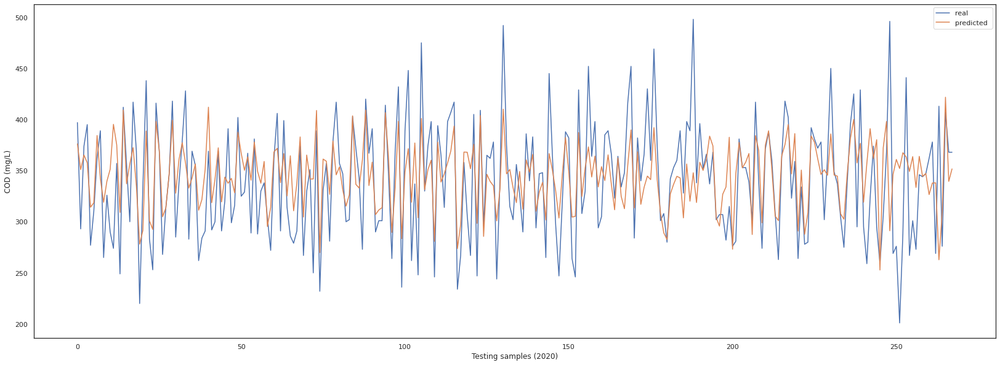

In [ ]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(1)

268

### Ensemble 4

In [ ]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [ ]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

## Testing


*** ANN estimation ***
MAPE:  12.18635995189615
R2:  -0.10738109463502177
RMSE:  52.348732764823836


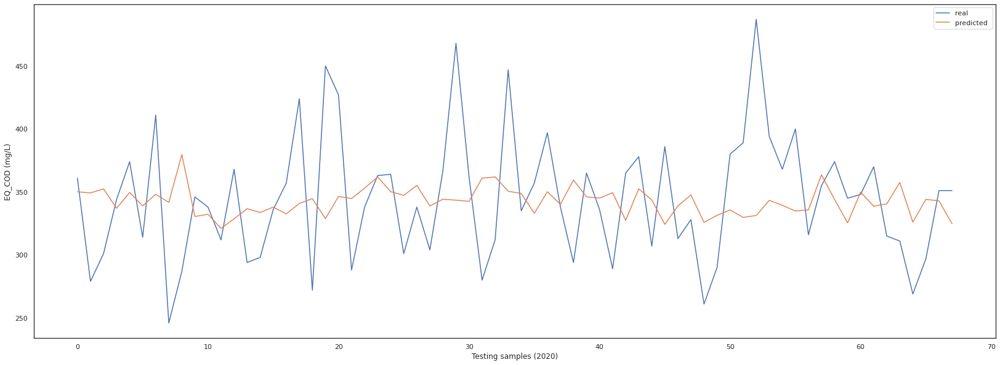

(68,)

In [ ]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  14.769947553041696
R2:  -0.4402237344083402
RMSE:  59.699762350357055


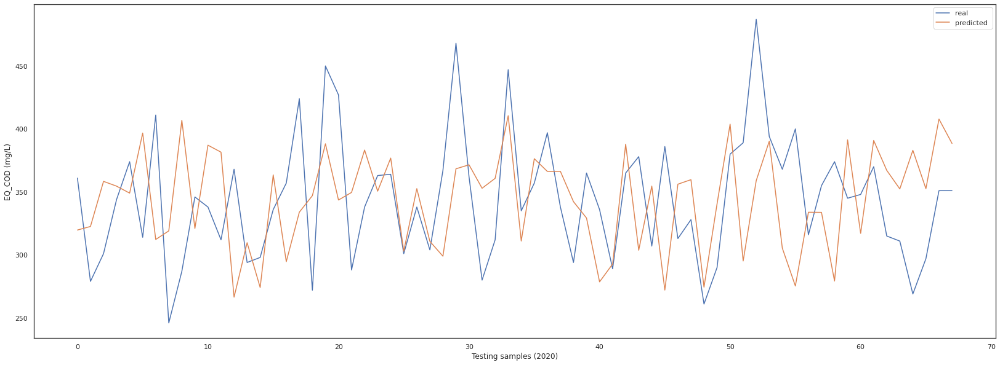

(68, 1)

In [ ]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  11.736336919570647
R2:  -0.050117732902723366
RMSE:  50.977275019645965


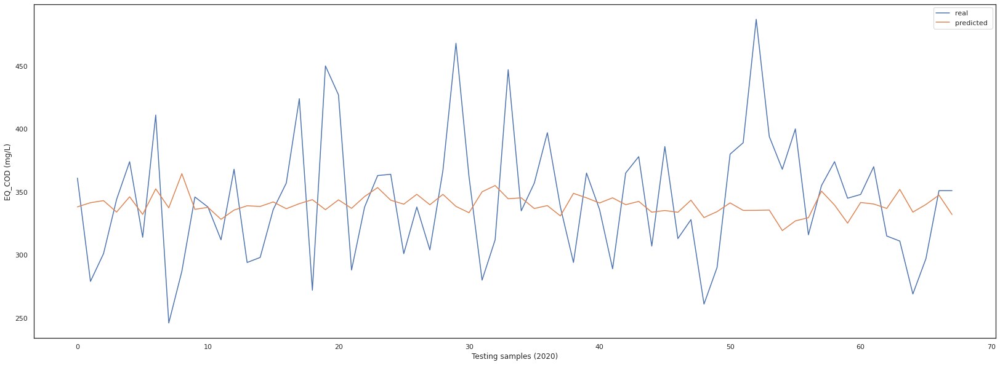

(68,)

In [ ]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  12.001130328646683


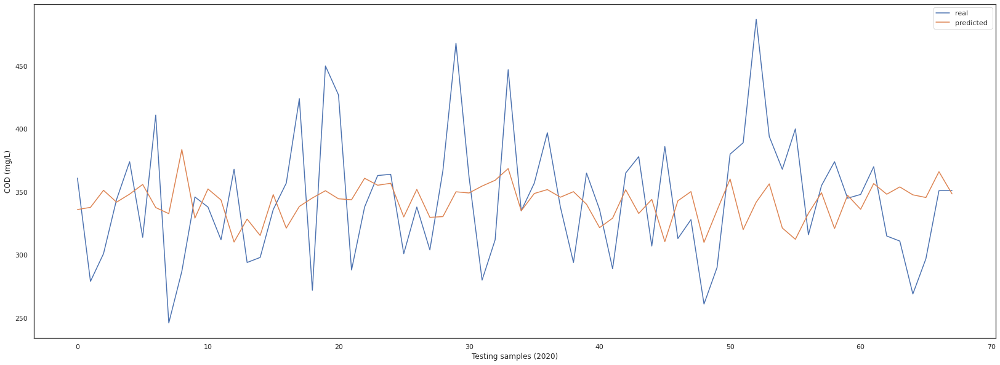

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[11.980906  11.676639  12.40812   12.716802  11.582914  23.896986
 13.0968685 13.309109  18.11154   14.461514  21.871347  16.028019
 29.30095   15.004323  23.543758  13.0637455 20.443457  11.977751
 11.44834   20.680761  11.460276  12.759502  15.71544   11.825811
 15.898253  13.565159  12.007427  14.02732   14.758177  17.07582
 16.767836  12.145658  12.225841  23.776806  12.760562  18.197716
 14.964761  14.900205  11.7249775 11.976254  16.940895  14.518708
 18.85506   12.487471  13.018626  30.23776   13.067259  12.826112
 31.691292  11.477486  26.037437  22.256079  12.635679  22.140379
 21.733757  29.23691   11.939531  11.529521  17.844572  18.87557
 11.90429   22.806551  16.897259  11.712603  17.910105  13.125558
 22.210632  18.995485 ], shape=(68,), dtype=float32)
MAPEsci:  5503.6088382496555
MAPE:  16.471327218253055
R2:  -0.7679637618105528
RMSE:  66.14458560771611


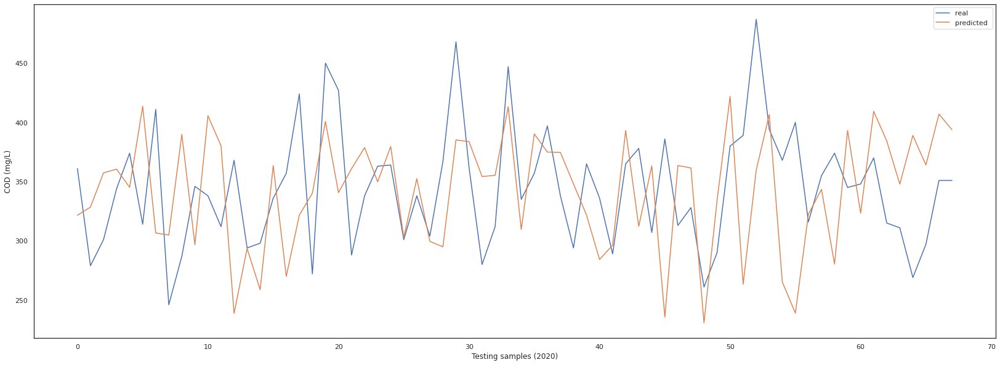

In [ ]:
ensemble_model.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[12.713979  12.056787  11.691256  12.604681  12.615013  18.042433
 11.485356  12.579405  12.854905  12.887848  21.263578  16.729115
 35.53637   14.917888  27.483383  16.036444  21.436888  11.494778
 12.7133255 20.901659  11.887181  12.176154  13.869407  11.50309
 13.048863  15.499471  11.947611  13.692556  13.952049  14.230001
 13.174007  11.410472  12.414963  15.947149  13.751054  18.767647
 11.713821  13.148821  11.598485  11.426302  23.617088  17.09619
 22.73742   15.159779  12.61397   34.16801   13.141565  12.980491
 33.54453   11.397124  24.617405  22.665333  14.851112  15.653173
 17.686506  31.202776  11.743312  12.171974  23.821396  17.993324
 12.4678545 20.967146  15.201179  12.1800995 19.406801  11.64226
 22.818727  20.73426  ], shape=(68,), dtype=float32)
MAPE:  16.433602859186134
R2:  -0.7975462507216666
RMSE:  66.6956727012188


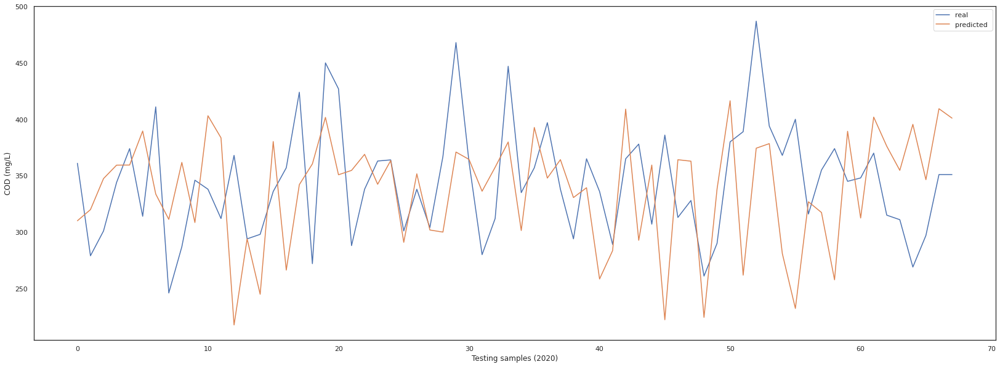

In [ ]:
ensemble_model2.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

      EQ_COD    model1    model2    model3
0   0.611995  1.011950 -0.785878 -0.256159
1   0.365516  0.905715 -0.697535  0.270076
2  -1.078153  1.272166  0.419371  0.528754
3  -0.690827 -0.499729  0.300809 -0.905392
4   0.066218  0.946393  0.128449  1.013739
..       ...       ...       ...       ...
63 -0.444347  1.863057  0.232135  1.936133
64 -0.514770 -1.762671  1.188370 -0.911852
65 -1.254210  0.315507  0.237726  0.049075
66 -0.761250  0.179153  1.961661  1.215052
67  0.189458 -1.911251  1.358252 -1.210567

[68 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  0  0  1
264  0  1  0
265  0  1  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
3/3 [==============================] - 0s 4ms/step - loss: 1.5412 - accuracy: 0.3088
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(14.565517363434596, shape=(), dtype=float64)
MAPEsci:  4998.544491038603
MAPE:  14.5655173634346
R2:  -0.4402237344083402
RMSE:  59.6997623503570

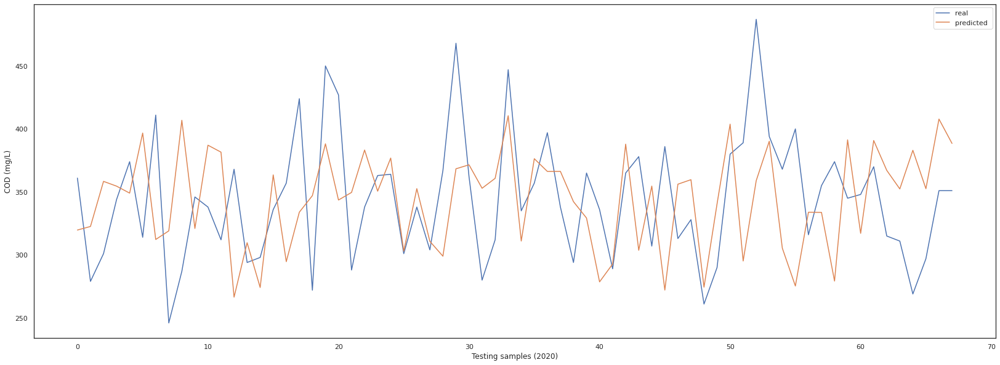

In [ ]:
ensemble_model3.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(3)

0

# D_COD_ON

In [ ]:
active_target = "D_COD_ON"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 343 entries, 227 to 338
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null   

## Approach 1

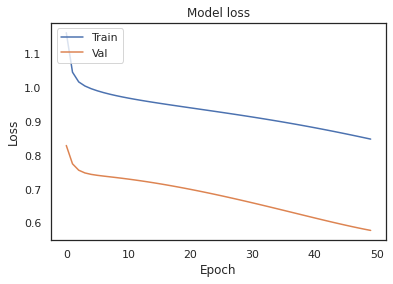

*** ANN estimation ***
MAPE * Founded
MAPE:  29.596027878980696
R2:  -0.04980297427771552
RMSE:  27.692649983455578


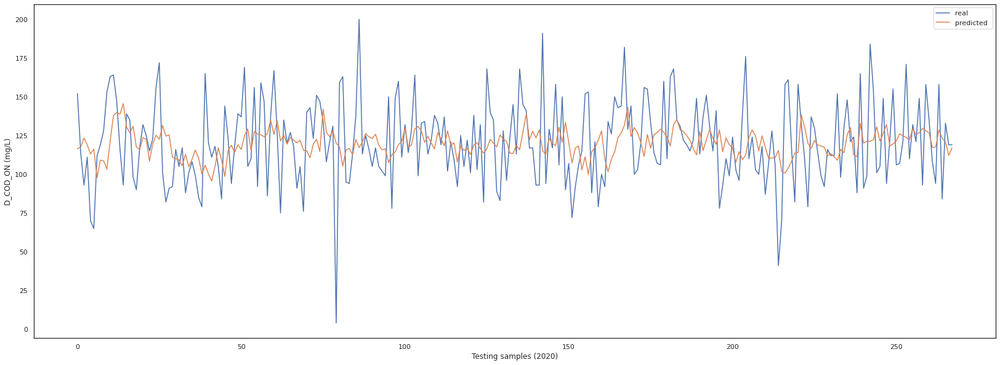

(268,)

In [ ]:
cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[2:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

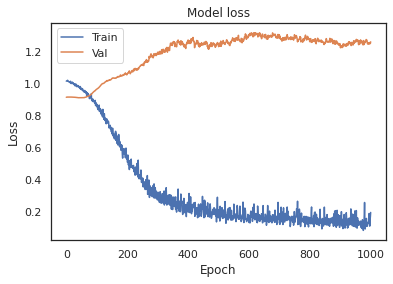

*** LSTM estimation ***
MAPE * Founded
MAPE:  35.77896849031612
R2:  0.6719743715708083
RMSE:  15.479770056493205


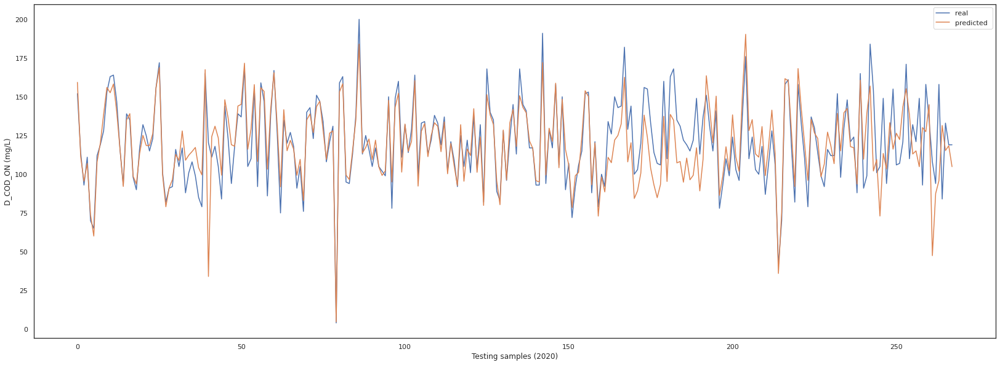

(268, 1)

In [ ]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training(max_epochs=1000)
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE * Founded
MAPE:  28.8568338357086
R2:  0.024064944753314887
RMSE:  26.700603406576423


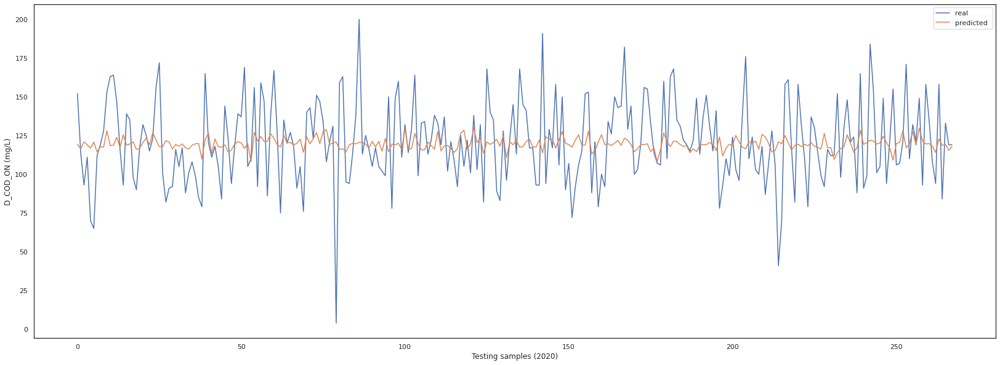

(268,)

In [ ]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

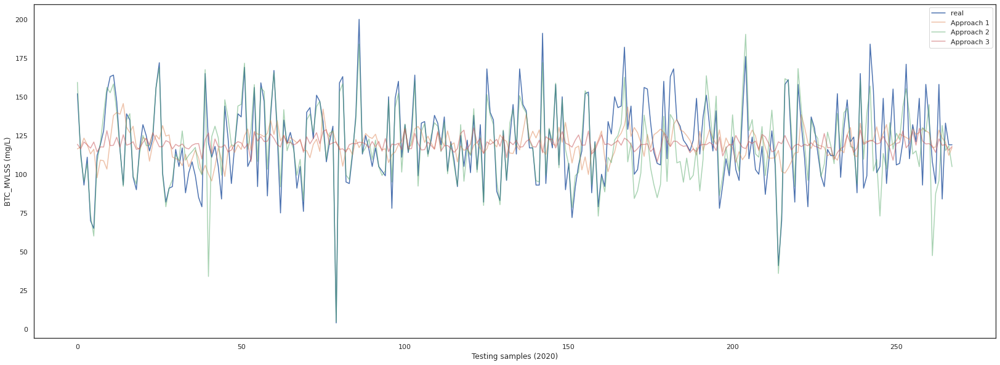

In [ ]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [ ]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      395.014580
1      345.167205
2      339.678064
3      344.949416
4      303.783083
          ...    
263    347.190459
264    373.431409
265    355.288696
266    345.952583
267    339.935185
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  28.961226829730702
R2:  0.010723044757877886
RMSE:  26.88249435926688


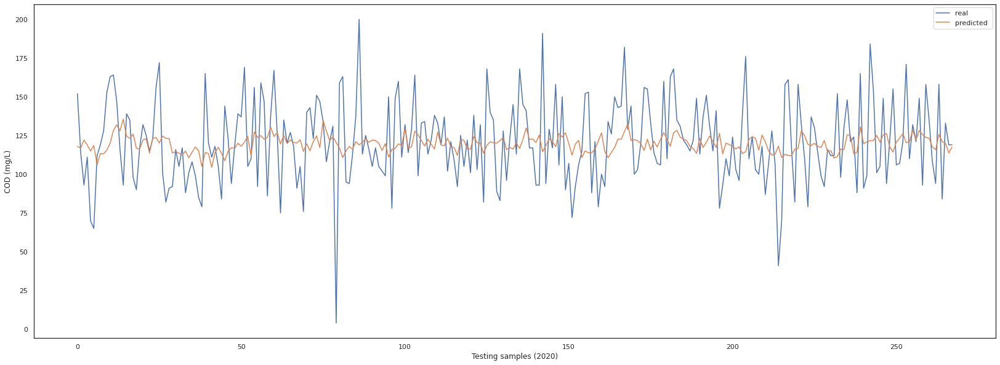

In [ ]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  21.06076103116334
R2:  0.427978297101409
RMSE:  20.44169341143706


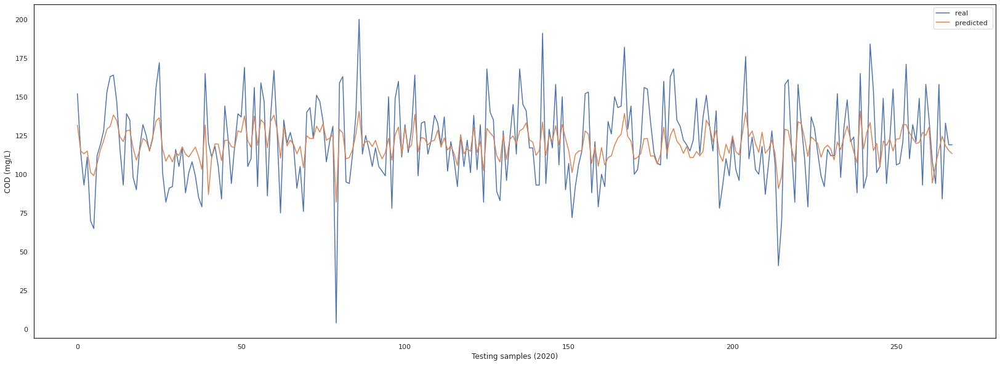

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

Epoch 1/50
8/8 [==============================] - 1s 27ms/step - loss: 3.9487 - MAPE: 300.2256 - val_loss: 2.5607 - val_MAPE: 572.2231
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 3.7734 - MAPE: 291.2136 - val_loss: 2.4458 - val_MAPE: 544.1382
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 3.6157 - MAPE: 280.6522 - val_loss: 2.3370 - val_MAPE: 516.1071
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 3.4714 - MAPE: 270.5004 - val_loss: 2.2386 - val_MAPE: 491.0039
Epoch 5/50
8/8 [==============================] - 0s 6ms/step - loss: 3.3226 - MAPE: 262.3296 - val_loss: 2.1512 - val_MAPE: 467.8872
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 3.1993 - MAPE: 254.7886 - val_loss: 2.0656 - val_MAPE: 445.7218
Epoch 7/50
8/8 [==============================] - 0s 5ms/step - loss: 3.0738 - MAPE: 245.7978 - val_loss: 1.9888 - val_MAPE: 425.0843
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

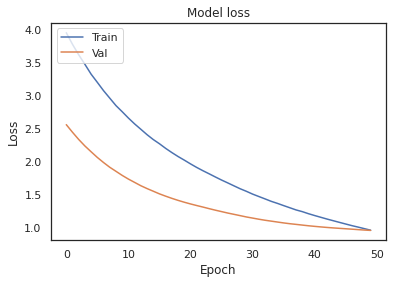

In [ ]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[4.7962515e+08 4.3032099e+08 4.5934042e+08 4.4848950e+08 4.5997674e+08
 4.7158314e+08 4.9425798e+08 4.6907894e+08 4.7742154e+08 4.9706035e+08
 4.7680442e+08 4.4271376e+08 4.9421440e+08 4.2611450e+08 4.9241354e+08
 4.6418154e+08 4.8088250e+08 4.7207795e+08 4.2927360e+08 4.3916710e+08
 4.8176586e+08 4.8229722e+08 4.6862595e+08 4.9077930e+08 4.8836240e+08
 4.6163651e+08 4.3309434e+08 4.6052976e+08 4.6235965e+08 4.5696170e+08
 4.6271766e+08 4.6700259e+08 4.7760579e+08 4.5140282e+08 4.7807466e+08
 4.6482701e+08 4.5630045e+08 4.6394989e+08 4.5077920e+08 4.8921798e+08
 5.1660640e+08 4.9376541e+08 4.7669229e+08 4.5664915e+08 4.7226016e+08
 5.0042931e+08 4.3779078e+08 4.3005370e+08 4.5651494e+08 4.8993056e+08
 4.8662330e+08 4.4258064e+08 4.7027315e+08 3.6963744e+08 5.0518080e+08
 4.7476339e+08 4.9633914e+08 4.8537965e+08 4.7015760e+08 5.0419651e+08
 4.8793670e+08 4.6097850e+08 4.2921034e+08 5.0112080e+08 4.6157891e+08
 4.8014202e+08 4.6006874e

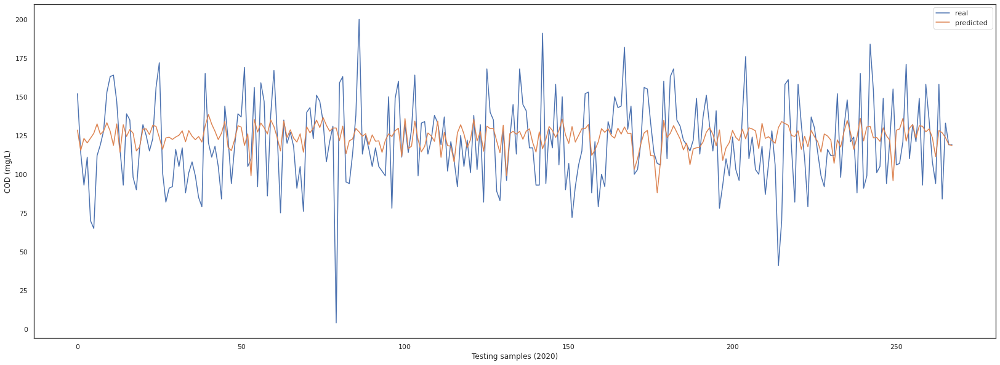

In [ ]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


Epoch 1/50
8/8 [==============================] - 1s 26ms/step - loss: 1.1027 - MAPE: 157.1245 - val_loss: 1.3882 - val_MAPE: 234.4308
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0555 - MAPE: 152.6991 - val_loss: 1.3511 - val_MAPE: 221.9745
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0112 - MAPE: 146.9263 - val_loss: 1.3184 - val_MAPE: 210.0287
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9693 - MAPE: 142.0532 - val_loss: 1.2958 - val_MAPE: 201.1377
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9278 - MAPE: 137.8013 - val_loss: 1.2709 - val_MAPE: 192.3690
Epoch 6/50
8/8 [==============================] - 0s 6ms/step - loss: 0.8896 - MAPE: 133.8969 - val_loss: 1.2490 - val_MAPE: 183.8092
Epoch 7/50
8/8 [==============================] - 0s 7ms/step - loss: 0.8530 - MAPE: 129.8232 - val_loss: 1.2305 - val_MAPE: 176.5901
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

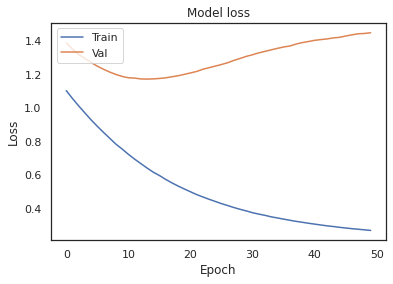

In [ ]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[5.2882586e+08 4.2799024e+08 3.6297331e+08 4.1371798e+08 2.5280307e+08
 2.0936877e+08 3.8909853e+08 4.3349638e+08 4.8163280e+08 5.1930106e+08
 5.3311930e+08 5.5605728e+08 5.3818880e+08 4.8404470e+08 3.8375555e+08
 5.1540970e+08 5.2476998e+08 3.9149968e+08 3.6214656e+08 4.4867286e+08
 5.0077504e+08 4.6668762e+08 4.3091366e+08 4.6158291e+08 5.3255965e+08
 5.4768627e+08 3.9339331e+08 2.9400093e+08 3.5477318e+08 3.6250598e+08
 4.2450326e+08 3.9878211e+08 4.5972064e+08 4.0333459e+08 4.0829251e+08
 4.2830224e+08 4.4421264e+08 3.8519549e+08 3.6063709e+08 4.7841955e+08
 4.3886696e+07 4.5571674e+08 4.6716198e+08 4.7537914e+08 3.6182061e+08
 4.7917344e+08 4.9152019e+08 4.7149526e+08 4.5082195e+08 5.1248019e+08
 5.2777581e+08 5.4816557e+08 4.7315066e+08 4.5132106e+08 5.5127770e+08
 4.2707706e+08 5.2112490e+08 5.4731827e+08 4.0369434e+08 5.0521040e+08
 5.4943667e+08 5.2600499e+08 3.3910797e+08 4.8922659e+08 4.5143990e+08
 4.9535546e+08 4.6547315e

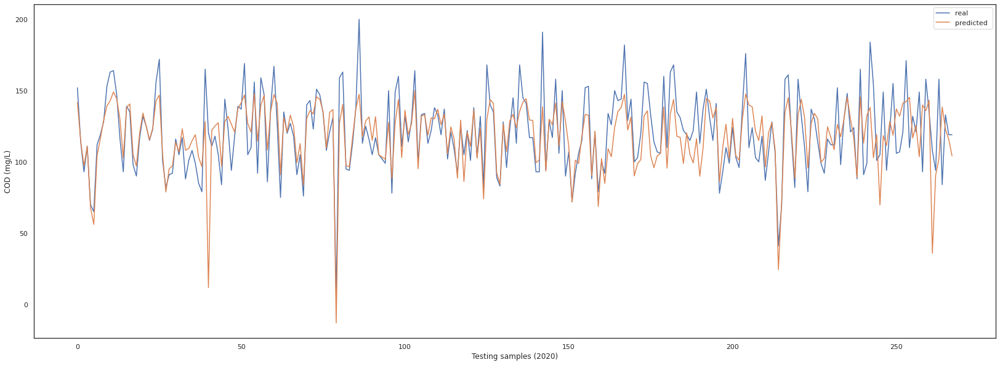

In [ ]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

     0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 29ms/step - loss: 1.2347 - accuracy: 0.2158 - val_loss: 1.2201 - val_accuracy: 0.4444
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.1557 - accuracy: 0.2739 - val_loss: 1.2239 - val_accuracy: 0.4444
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0990 - accuracy: 0.3485 - val_loss: 1.2334 - val_accuracy: 0.3704
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0453 - accuracy: 0.3983 - val_loss: 1.2464 - val_accuracy: 0.2963
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0013 - accuracy: 0.4979 - val_loss: 1.2634 - val_accuracy: 0.2222
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 0.9653 - accuracy: 0.5809 - val_loss: 1.2

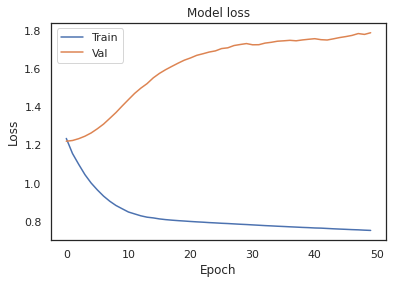

In [ ]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

     D_COD_ON    model1    model2    model3
0    0.484527 -0.397827  1.573618 -0.065058
1    1.125601 -0.251248 -0.327324 -0.830006
2   -0.227778  0.420377 -0.945301  0.322696
3   -0.975698 -0.089323 -0.493167 -0.156606
4   -0.334624 -0.783178 -1.803220 -0.704259
..        ...       ...       ...       ...
263 -0.940082  1.032785 -0.933957  0.848436
264  1.339292  0.423048  0.474127 -0.246302
265 -1.296235  0.117116 -0.164546 -0.086727
266  0.448911 -0.895608 -0.042648 -1.078470
267 -0.049702 -0.308560 -0.576232 -0.428635

[268 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 0.8562 - accuracy: 0.6493
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(126920025.61440738, shape=(), dtype=float64)
MAPEsci:  1036.1593303395741
MAPE * Founded
MAPE:  9.038192197483111
R2:  0.67197437157

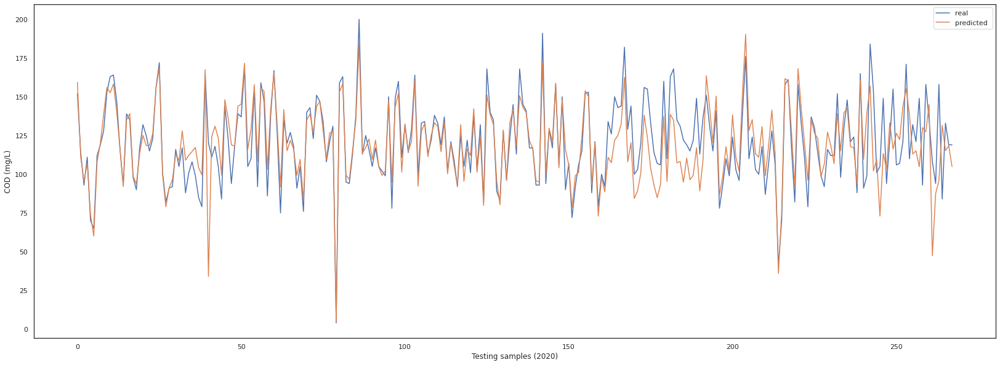

In [ ]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(1)

268

### Ensemble 4

In [ ]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [ ]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

## Testing


*** ANN estimation ***
MAPE:  18.41123830685301
R2:  -0.1398117007528048
RMSE:  25.457194141429067


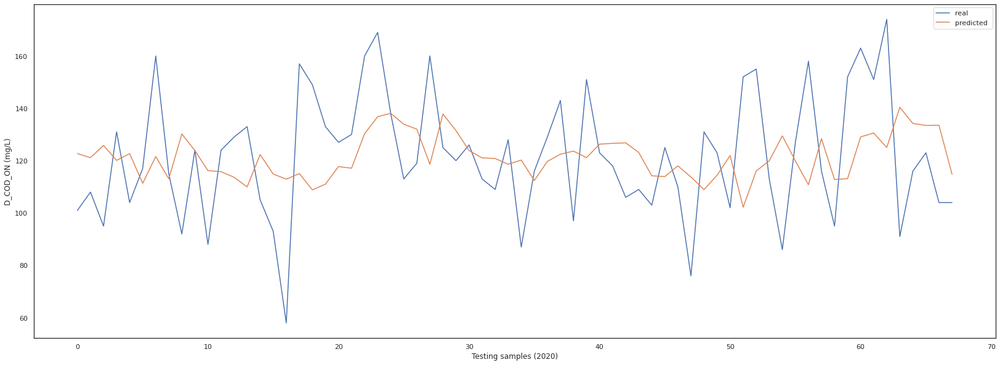

(68,)

In [ ]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  23.559080795830738
R2:  -0.9900326343492323
RMSE:  33.637528469249496


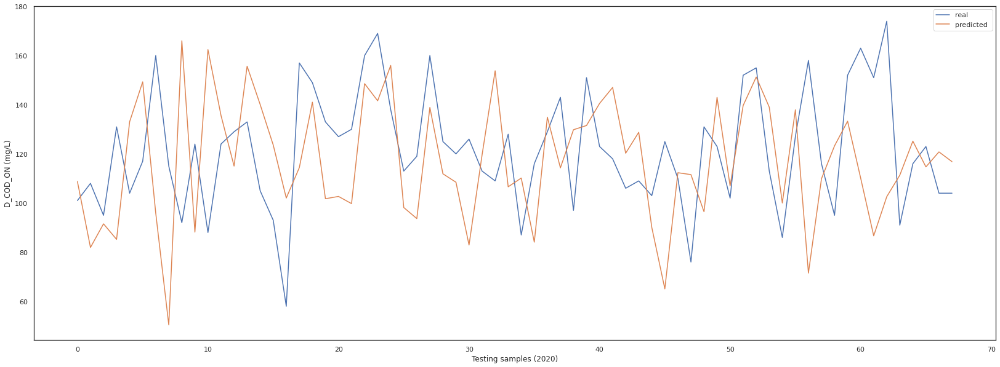

(68, 1)

In [ ]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  16.311120877031588
R2:  -0.04638471977705305
RMSE:  24.39156541922568


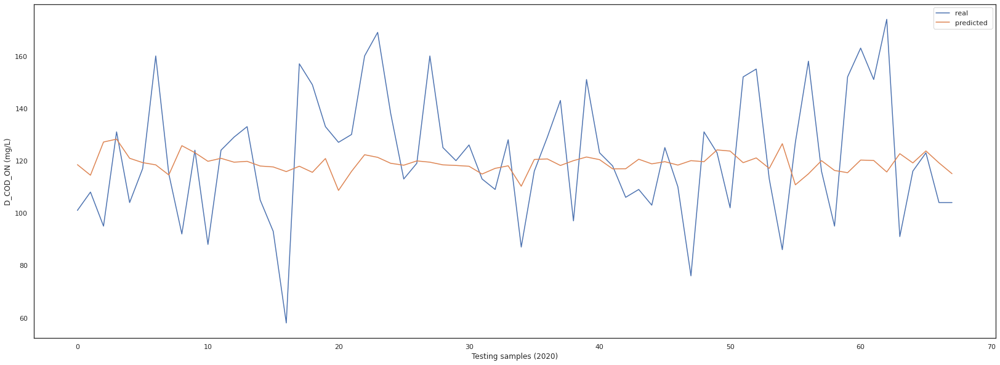

(68,)

In [ ]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  17.78227250341354


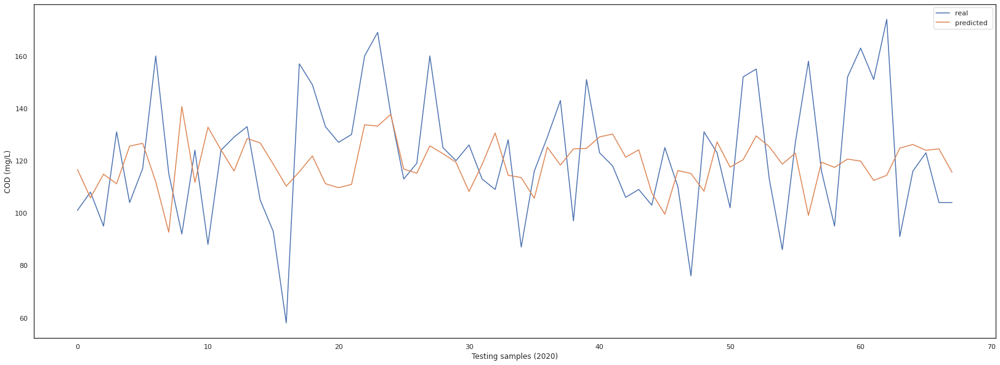

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[16.333105 16.96547  19.337515 18.151903 19.30714  18.790354 16.172243
 16.47735  20.553095 17.298615 18.576582 18.475496 16.729223 19.129553
 17.605717 16.818836 16.31107  16.582506 17.794764 17.050676 21.129217
 16.17902  19.631725 18.782644 16.395197 16.204105 16.784805 18.936487
 16.190184 16.322226 16.208635 16.39092  16.85307  16.232964 20.99113
 17.494793 19.081585 16.43733  18.961452 19.152279 19.334215 16.36124
 16.223167 18.968071 17.094788 18.134386 16.468094 16.649729 17.756231
 19.93864  17.726645 19.676886 19.714394 16.948729 19.096024 18.13831
 16.7056   17.540594 16.604937 16.525171 17.720856 16.711107 16.831373
 19.39225  16.839127 19.747488 16.813    16.13932 ], shape=(68,), dtype=float32)
MAPEsci:  1960.3535035077264
MAPE:  17.715019801231914
R2:  -0.06802806643407666
RMSE:  24.642531019411717


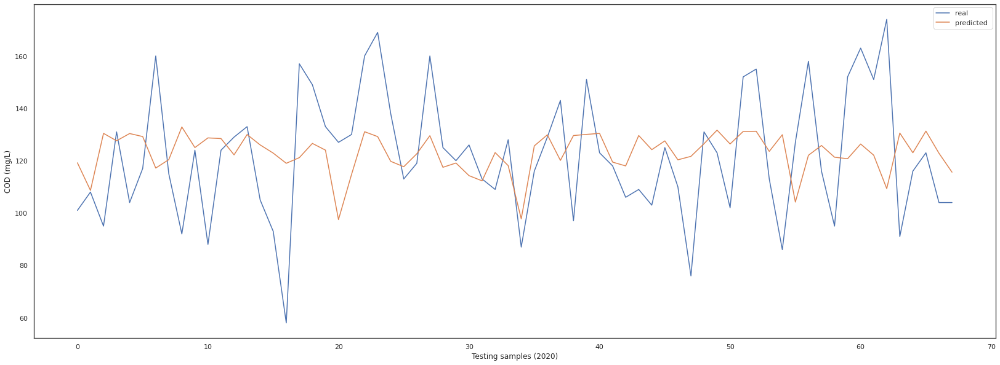

In [ ]:
ensemble_model.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[16.208136 27.691809 24.323597 33.16106  24.351622 19.432554 21.78847
 69.104195 28.530592 25.783236 24.66668  17.968859 16.199629 22.767296
 23.747774 17.29065  17.635859 17.134113 20.99533  22.008047 16.61117
 20.42352  26.243586 27.431885 29.78431  17.01468  19.560915 22.068352
 17.655125 16.787947 31.196451 17.97346  24.940605 17.03173  16.232527
 31.702852 21.908302 16.8342   24.324802 19.689478 25.9848   24.92652
 19.60253  21.412506 27.436998 50.09895  16.159187 16.481285 21.879177
 25.808043 16.965822 18.489397 28.271055 23.005823 18.463848 17.65846
 46.251602 16.23778  16.753937 17.364332 16.32053  27.292362 16.886734
 17.427053 21.517218 17.427343 20.060394 16.447382], shape=(68,), dtype=float32)
MAPE:  22.777007170084794
R2:  -0.9522937385589938
RMSE:  33.31705147596054


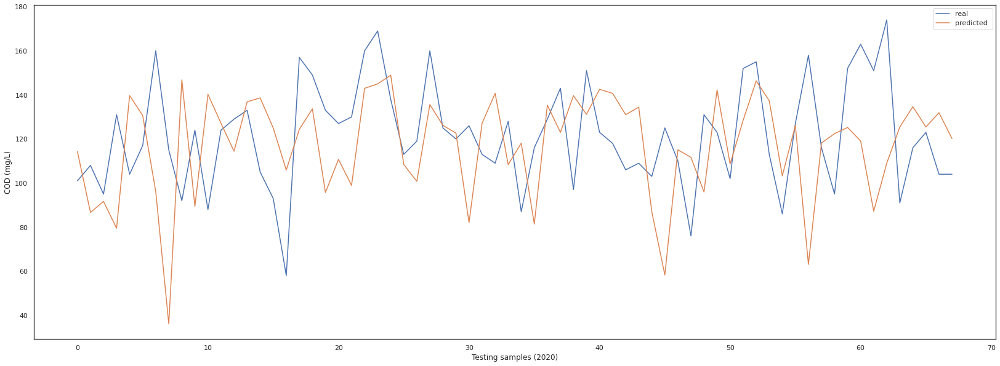

In [ ]:
ensemble_model2.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

    D_COD_ON    model1    model2    model3
0   0.769448  0.350365 -0.422847 -0.283677
1  -0.690776  0.161207 -1.483027 -1.323068
2  -0.441469  0.716168 -1.103280  1.949687
3  -0.904467  0.039757 -1.353362  2.230952
4   0.377681  0.347126  0.537124  0.345406
..       ...       ...       ...       ...
63  1.909136  2.432030 -0.321260  0.800060
64 -1.046928  1.708924  0.225643 -0.110078
65 -0.156548  1.615934 -0.188322  1.068847
66  0.092759  1.628621  0.052657 -0.107575
67 -0.583930 -0.585452 -0.104452 -1.175209

[68 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  1  0  0
266  0  1  0
267  0  0  1

[268 rows x 3 columns]
3/3 [==============================] - 0s 4ms/step - loss: 1.5044 - accuracy: 0.2647
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(23.394456505606357, shape=(), dtype=float64)
MAPEsci:  2743.7787897446574
MAPE:  23.394456505606353
R2:  -0.9900326343492323
RMSE:  33.6375284692

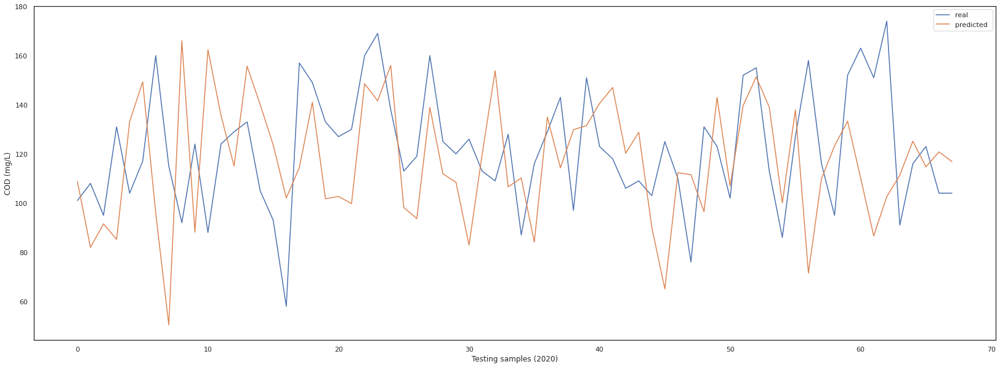

In [ ]:
ensemble_model3.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(3)

0